## Preprocess the data and get adjacency matrix 

In [1]:
import os,sys,inspect
current_dir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
parent_dir = os.path.dirname(current_dir)
sys.path.insert(1, parent_dir+'\Covariance and Adjacency Matrix')
from DataManager import dataManager

name: X_test
shape: (640, 31, 1518)
-----------------------
name: X_train
shape: (640, 31, 1395)
-----------------------
name: clip_sizes_test
shape: (2, 129)
-----------------------
name: clip_sizes_train
shape: (2, 127)
-----------------------
name: conv_sizes
shape: (1, 1)
-----------------------
name: n_pre_szr
shape: (1, 1)
-----------------------
name: sel_win_nums_test
shape: (1, 1518)
-----------------------
name: sel_win_nums_train
shape: (1, 1395)
-----------------------
name: soz_ch_ids
shape: (5, 1)
-----------------------
name: stride_sec
shape: (1, 1)
-----------------------
name: window_size_sec
shape: (1, 1)
-----------------------
name: y_test
shape: (1, 1518)
-----------------------
name: y_train
shape: (1, 1395)
-----------------------


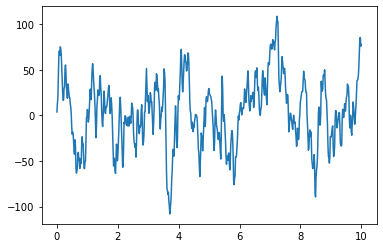

In [2]:
import h5py
import numpy as np
filepath = parent_dir+'\datasets\sample_patients\pat_FR_620.mat'
variables = {}
f = h5py.File(filepath, 'r')
for k, v in f.items():
    variables[k] = np.array(v)
for key in variables.keys():
    print("name:", key)
    print("shape:", variables[key].shape)
    print("-----------------------")
#print sample EGG signal from one node
import matplotlib.pyplot as plt

plt.figure()
ax = plt.axes()
X_train = variables["X_train"]
X_test = variables["X_test"]

ax.plot(np.linspace(0, 10, 640), X_train[:,5,0])

--------data manager successfully initialized--------


C:\Users\caixu\Documents\GitHub\GCNGDE_Simulation_for_EGG_analysis\Covariance and Adjacency Matrix\DataManager.py:118: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax1 = plt.axes()
C:\Users\caixu\Documents\GitHub\GCNGDE_Simulation_for_EGG_analysis\Covariance and Adjacency Matrix\DataManager.py:118: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax1 = plt.axes()
C:\Users\caixu\Documents\GitHub\GCNGDE_Simulation_for_EGG_analysis\C

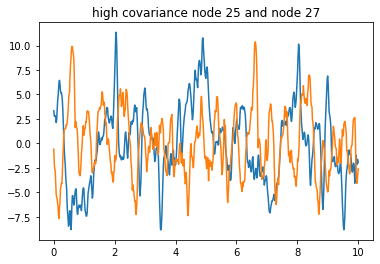

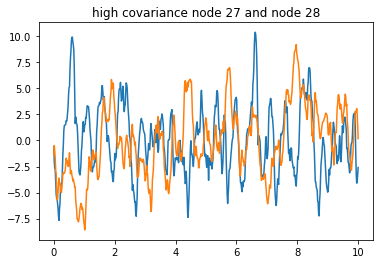

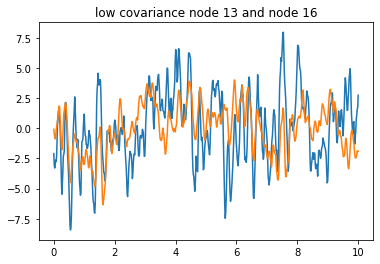

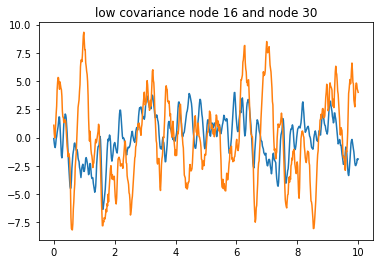

In [3]:
dm = dataManager(variables["X_train"],variables["X_test"],variables["y_train"],variables["y_test"],10**(-4))

dm.sanity_check(4.514*10**-1, -10**-3, parent_dir)

## create normalized adjacency matrix 

In [14]:
import matplotlib.pyplot as plt
from scipy.linalg import fractional_matrix_power
def show_heat_map(m):
    plt.imshow(m, cmap='hot', interpolation='nearest')
    plt.colorbar()
    plt.show()
    
    
def create_DAD(adj):
    np.fill_diagonal(adj, 1)
    rowsum = np.sum(adj, axis=1)
    d = np.diag_indices(adj.shape[0]) 
    D = np.zeros(adj.shape)
    D[d] = rowsum
    #print(rowsum)
    D = fractional_matrix_power(D, -0.5)
    #print(D)
    return D@adj@D

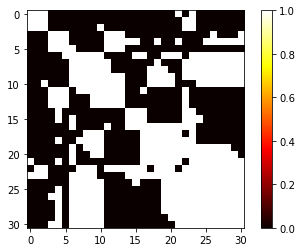

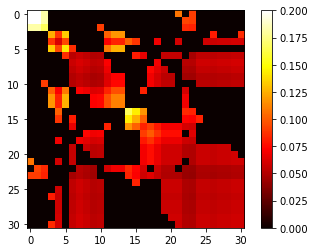

In [16]:
#first fine tune a good threshold n
n = 0.5*10**-5
dm.re_threshold(n)
show_heat_map(dm.A_train)
show_heat_map(create_DAD(dm.A_train))

## Modified GCN Class

In [17]:
import torch
import torch.autograd
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

In [18]:
class GCN(nn.Module):
    def __init__(self, in_features, out_features, bias=False):
        super(GCN, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        
        self.weight = nn.Parameter(torch.Tensor(in_features, out_features))
        if bias:
            self.bias = nn.Parameter(torch.Tensor(out_features))
        else:
            self.register_parameter('bias', None)
        
        self.reset_parameters()

    def __repr__(self):
        return self.__class__.__name__ + ' (' \
               + str(self.in_features) + ',' \
               + str(self.out_features) + ')'
    
    def reset_parameters(self):
        stdv = 1. / self.weight.size(1) ** 1/2
        self.weight.data.uniform_(-stdv, stdv)
        if self.bias is not None:
            self.bias.data.uniform_(-stdv, stdv)
    
    # H, feature matrix
    # A, precomputed adj matrix
    def forward(self, H, A):
        n = torch.matmul(A, torch.matmul(H, self.weight))
        if self.bias is not None:
            return n + self.bias
        else:
            return n

class SimularityMatrix(nn.Module):
    def __init__(self, in_features):
        super(SimularityMatrix, self).__init__()
        self.in_features = in_features
        
        self.weight = nn.Parameter(torch.Tensor(in_features))
        #self.weight = torch.squeeze(self.weight)
        
        self.reset_parameters()

    def __repr__(self):
        return self.__class__.__name__ + ' (' \
               + str(self.in_features) +')'
    
    def reset_parameters(self):
        stdv = 1. / self.weight.size(0) ** 1/2
        self.weight.data.uniform_(-stdv, stdv)
    
    #computes the simularity matrix:
    # H, feature matrix --> N x D
    # A, precomputed adj matrix --> NxN
    # this method is pretty wack, need to find a vectorized way to do it.
    def forward(self, H, H0):
        #get hidden state (concate H0 and H)
        Z = torch.cat((H0, H), 2)
        M = Z.shape[0]
        N = Z.shape[1]
        D = Z.shape[2]
        #centering normalize Z
        Z = self.fcn(Z)
        sim_matrix = torch.zeros(M ,N, N)
        for u in range(N):
            for v in range(N):
                if u>v:
                    zu = torch.reshape(Z[:,u,:], (M,1,D))
                    zv = torch.reshape(Z[:,v,:], (M,1,D))
                    sim_matrix[:,u,v] = self.get_sim(zu, zv)
                    sim_matrix[:,v,u] = sim_matrix[:,u,v]
                elif u==v:    
                    zu = torch.reshape(Z[:,u,:], (M,1,D))
                    a = self.get_sim(zu, zu)
                    #print(a.shape, sim_matrix.shape)
                    sim_matrix[:,u,v] = a
        return sim_matrix
        
    #simularity between node u and node v (shape Mx1xD)
    #return the u,v index of the simularity matrix
    def get_sim(self, u,v):
        theta = torch.diag(self.weight)
        #print(self.weight)
        #print(u.shape, theta.shape, self.weight.shape, torch.transpose(v, 1, 2).shape)
        return torch.squeeze(torch.matmul(torch.matmul(u, theta), torch.transpose(v, 1, 2)))
        
    #centering-normalizing (CN) operator
    def fcn(self, u):
        norm_u = (u - torch.mean(u, dim=2, keepdim=True))
        return norm_u/(((1/(self.in_features-1)) * torch.sum(norm_u**2, dim = 2, keepdim = True))**(1/2))

In [19]:
# n-layer GCN Network
class Net(nn.Module):
    def __init__(self, body_features, n_layers, activation = F.relu, bias=False):
        super(Net, self).__init__()
        assert(n_layers >= 1)
        self.activation = activation
        self.head = GCN(body_features, body_features, bias)
        self.layers = nn.ModuleList()
        for i in range(n_layers - 1):
            self.layers.append(GCN(body_features, body_features, bias))
        self.tail = SimularityMatrix(body_features*2) # size(H_0 + h_u)

    def forward(self, h_0, A):
        x = self.activation(self.head(h_0, A))
        for layer in self.layers:
            x = self.activation(layer(x, A))
        sim_matrix = self.tail(x, h_0)
        return sim_matrix

In [20]:
class sim_loss(torch.nn.Module):

    def __init__(self):
        super(sim_loss,self).__init__()

    def forward(self, sim_matrix, A, epsilon = 1e-8):
        A_tf = (A!=0)
        abs_N = torch.sum(A_tf, dim = 1, keepdim = True)
        logexp_S = torch.log(torch.sum(torch.exp(sim_matrix), dim = 2, keepdim = True)+epsilon)
        obj_matrix = A_tf*(sim_matrix - abs_N * logexp_S)
        return -torch.sum(obj_matrix)

In [21]:
A = torch.from_numpy(create_DAD(dm.A_train)).float()
X_train = torch.from_numpy(dm.X_train).float()
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
parameters = {
    'body': dm.X_train.shape[2],
    'M': dm.X_train.shape[0],
    'batch_size': 64,
    'n_layers': 2,
    'num_epochs': 2000,
    'learning_rate': 1e-2,
    'weight_decay': 5e-3
}
print(parameters)

{'body': 640, 'M': 1387, 'batch_size': 64, 'n_layers': 2, 'num_epochs': 2000, 'learning_rate': 0.01, 'weight_decay': 0.005}


In [22]:
A = A.to(device)
model = Net(parameters['body'], parameters['n_layers'], F.relu, bias=True).to(device)
input_features = X_train.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=parameters['learning_rate'], weight_decay=parameters['weight_decay'])
criterion = sim_loss()

In [23]:
torch.cuda.empty_cache()
from torchsummary import summary
print(model)
summary(model, [(31,640), (31,31)])

Net(
  (head): GCN (640,640)
  (layers): ModuleList(
    (0): GCN (640,640)
  )
  (tail): SimularityMatrix (1280)
)
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
               GCN-1              [-1, 31, 640]         410,240
               GCN-2              [-1, 31, 640]         410,240
  SimularityMatrix-3               [-1, 31, 31]           1,280
Total params: 821,760
Trainable params: 821,760
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 72.73
Forward/backward pass size (MB): 0.31
Params size (MB): 3.13
Estimated Total Size (MB): 76.18
----------------------------------------------------------------


In [24]:
n_epochs = parameters['num_epochs']
batch_size = parameters['batch_size']
from tqdm import tqdm
for epoch in range(1, n_epochs+1):

    # X is a torch Variable
    permutation = torch.randperm(input_features.shape[0])

    for i in tqdm(range(0,input_features.shape[0], batch_size)):
        model.train()
        optimizer.zero_grad()

        indices = permutation[i:i+batch_size] if i+batch_size < input_features.shape[0] else permutation[i:] 
        batch_x= input_features[indices, :,:]

        # in case you wanted a semi-full example
        sim_matrix = model(batch_x, A).to(device)
        train_loss = criterion(sim_matrix, A)
        train_loss.backward()
        optimizer.step()
        print("Epoch:", epoch, "  Batch:", int((i/batch_size)+1),"of size",batch_size, "  Train loss:", train_loss, end="\r")
    print()
'''
for epoch in range(1, num_epochs + 1):
    model.train()
    optimizer.zero_grad()
    sim_matrix = model(input_features, A)
    train_loss = criterion(sim_matrix, A)
    train_loss.backward()
    optimizer.step()
    print("{}: \ttrain loss {}".format(epoch, train_loss))
'''

  5%|▍         | 1/22 [00:00<00:10,  1.97it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.05it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.10it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.26it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.27it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.27it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.27it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.26it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.27it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1   Batch: 22 of size 64   Train loss: tensor(-5232921., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.26it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.26it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 2   Batch: 22 of size 64   Train loss: tensor(-5262530., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.26it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:03<00:05,  2.26it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.26it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.26it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.26it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.28it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.29it/s]

 82%|████████▏ | 18/22 [00:07<00:01,  2.28it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.27it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.28it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.29it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 3   Batch: 22 of size 64   Train loss: tensor(-5264430., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.26it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.26it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 4   Batch: 22 of size 64   Train loss: tensor(-5264430., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.27it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.28it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 5   Batch: 22 of size 64   Train loss: tensor(-5264549., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.26it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.27it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.28it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 6   Batch: 22 of size 64   Train loss: tensor(-5264512., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.26it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.26it/s]

 41%|████      | 9/22 [00:03<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 7   Batch: 22 of size 64   Train loss: tensor(-5264571., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.29it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.29it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.27it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.27it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.27it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.27it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.26it/s]

 41%|████      | 9/22 [00:03<00:05,  2.27it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.27it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 8   Batch: 22 of size 64   Train loss: tensor(-5264579.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.26it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.28it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.29it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.29it/s]

 27%|██▋       | 6/22 [00:02<00:06,  2.29it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.28it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.28it/s]

 41%|████      | 9/22 [00:03<00:05,  2.27it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.28it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.27it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.27it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 9   Batch: 22 of size 64   Train loss: tensor(-5264549., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  1.92it/s]

  9%|▉         | 2/22 [00:01<00:10,  1.94it/s]

 14%|█▎        | 3/22 [00:01<00:09,  1.97it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.02it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.07it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.11it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.11it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.10it/s]

 41%|████      | 9/22 [00:04<00:06,  1.99it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.01it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.01it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.02it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.03it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.07it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.10it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.13it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.11it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.10it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.09it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.09it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.07it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 10   Batch: 22 of size 64   Train loss: tensor(-5264624., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:19,  1.06it/s]

  9%|▉         | 2/22 [00:01<00:16,  1.23it/s]

 14%|█▎        | 3/22 [00:01<00:13,  1.39it/s]

 18%|█▊        | 4/22 [00:02<00:11,  1.52it/s]

 23%|██▎       | 5/22 [00:02<00:10,  1.63it/s]

 27%|██▋       | 6/22 [00:03<00:09,  1.75it/s]

 32%|███▏      | 7/22 [00:03<00:08,  1.82it/s]

 36%|███▋      | 8/22 [00:04<00:07,  1.91it/s]

 41%|████      | 9/22 [00:04<00:06,  1.99it/s]

 45%|████▌     | 10/22 [00:05<00:05,  2.01it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.01it/s]

 55%|█████▍    | 12/22 [00:06<00:04,  2.04it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.08it/s]

 64%|██████▎   | 14/22 [00:07<00:03,  2.11it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.12it/s]

 73%|███████▎  | 16/22 [00:08<00:02,  2.14it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:09<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.11it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 11   Batch: 22 of size 64   Train loss: tensor(-5264553., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.05it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.06it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.03it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.06it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.08it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.08it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.12it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.12it/s]

 41%|████      | 9/22 [00:04<00:06,  2.12it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.11it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.09it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.10it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.06it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.07it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.09it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.12it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 12   Batch: 22 of size 64   Train loss: tensor(-5264714., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.11it/s]

 59%|█████▉    | 13/22 [00:06<00:05,  1.65it/s]

 64%|██████▎   | 14/22 [00:06<00:04,  1.71it/s]

 68%|██████▊   | 15/22 [00:07<00:04,  1.58it/s]

 73%|███████▎  | 16/22 [00:08<00:03,  1.69it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  1.81it/s]

 82%|████████▏ | 18/22 [00:09<00:02,  1.89it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  1.99it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.06it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.11it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 13   Batch: 22 of size 64   Train loss: tensor(-5264725., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.27it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.27it/s]

 41%|████      | 9/22 [00:03<00:05,  2.27it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.27it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.26it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.26it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:07<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 14   Batch: 22 of size 64   Train loss: tensor(-5264685.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.11it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.11it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.12it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.14it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.14it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.13it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 15   Batch: 22 of size 64   Train loss: tensor(-5264736., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.26it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 16   Batch: 22 of size 64   Train loss: tensor(-5264708., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.29it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.28it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.29it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.26it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.27it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.27it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.28it/s]

 82%|████████▏ | 18/22 [00:07<00:01,  2.29it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.29it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 17   Batch: 22 of size 64   Train loss: tensor(-5264670., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.14it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.13it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.10it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.26it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.26it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.26it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.27it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 18   Batch: 22 of size 64   Train loss: tensor(-5264718.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.29it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.27it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.28it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.27it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.27it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.27it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.26it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.27it/s]

 41%|████      | 9/22 [00:03<00:05,  2.28it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.27it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.29it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.26it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.27it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.27it/s]

 82%|████████▏ | 18/22 [00:07<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 19   Batch: 22 of size 64   Train loss: tensor(-5264772.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.26it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.26it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.26it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.27it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.27it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.27it/s]

 41%|████      | 9/22 [00:03<00:05,  2.27it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.27it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.26it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.26it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.26it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.26it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.26it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.26it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:07<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 20   Batch: 22 of size 64   Train loss: tensor(-5264739.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.26it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.15it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 21   Batch: 22 of size 64   Train loss: tensor(-5264778., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.13it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:06,  2.12it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.10it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.13it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 22   Batch: 22 of size 64   Train loss: tensor(-5264864., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.26it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.26it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.26it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 23   Batch: 22 of size 64   Train loss: tensor(-5264881., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.27it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.27it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.26it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.26it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.26it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.27it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 24   Batch: 22 of size 64   Train loss: tensor(-5264921., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.29it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.29it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.28it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.28it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.27it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.27it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.27it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.26it/s]

 41%|████      | 9/22 [00:03<00:05,  2.28it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.27it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.27it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.26it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.26it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.26it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.27it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.26it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:07<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.26it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 25   Batch: 22 of size 64   Train loss: tensor(-5264786., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.26it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 26   Batch: 22 of size 64   Train loss: tensor(-5264912.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.26it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.26it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 27   Batch: 22 of size 64   Train loss: tensor(-5264942.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.27it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.26it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.26it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.26it/s]

 41%|████      | 9/22 [00:03<00:05,  2.26it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.26it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.27it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.29it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.26it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.26it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.26it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:07<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.26it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 28   Batch: 22 of size 64   Train loss: tensor(-5264951., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.27it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.27it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.27it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.27it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:03<00:05,  2.26it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 29   Batch: 22 of size 64   Train loss: tensor(-5264987., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.28it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.28it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 30   Batch: 22 of size 64   Train loss: tensor(-5264963.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 31   Batch: 22 of size 64   Train loss: tensor(-5264699., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 32   Batch: 22 of size 64   Train loss: tensor(-5265085.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 33   Batch: 22 of size 64   Train loss: tensor(-5265013., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 34   Batch: 22 of size 64   Train loss: tensor(-5265038.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 35   Batch: 22 of size 64   Train loss: tensor(-5265137., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.28it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.27it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 36   Batch: 22 of size 64   Train loss: tensor(-5265138., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 37   Batch: 22 of size 64   Train loss: tensor(-5265202.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 38   Batch: 22 of size 64   Train loss: tensor(-5265080., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 39   Batch: 22 of size 64   Train loss: tensor(-5265052., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 40   Batch: 22 of size 64   Train loss: tensor(-5265202., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 41   Batch: 22 of size 64   Train loss: tensor(-5265091., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 42   Batch: 22 of size 64   Train loss: tensor(-5258272., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.26it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 43   Batch: 22 of size 64   Train loss: tensor(-5262697., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 44   Batch: 22 of size 64   Train loss: tensor(-5253787., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.26it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 45   Batch: 22 of size 64   Train loss: tensor(-4912497., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.26it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 46   Batch: 22 of size 64   Train loss: tensor(-5255539., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 47   Batch: 22 of size 64   Train loss: tensor(-5264684., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 48   Batch: 22 of size 64   Train loss: tensor(-5264805., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.26it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.26it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.26it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.27it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.26it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.27it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 49   Batch: 22 of size 64   Train loss: tensor(-5264874.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 50   Batch: 22 of size 64   Train loss: tensor(-5264903., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 51   Batch: 22 of size 64   Train loss: tensor(-5264940., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 52   Batch: 22 of size 64   Train loss: tensor(-5264971.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.11it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.13it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.14it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.12it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 53   Batch: 22 of size 64   Train loss: tensor(-5264969., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.14it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.12it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.13it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.12it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.13it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 54   Batch: 22 of size 64   Train loss: tensor(-5264988., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.26it/s]

 41%|████      | 9/22 [00:04<00:05,  2.26it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 55   Batch: 22 of size 64   Train loss: tensor(-5265019.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.11it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 56   Batch: 22 of size 64   Train loss: tensor(-5264979.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.26it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.26it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.12it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 57   Batch: 22 of size 64   Train loss: tensor(-5265009., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.11it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.12it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.14it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 58   Batch: 22 of size 64   Train loss: tensor(-5264969., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 59   Batch: 22 of size 64   Train loss: tensor(-5265044., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.14it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 60   Batch: 22 of size 64   Train loss: tensor(-5264975., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.14it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.13it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.12it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 61   Batch: 22 of size 64   Train loss: tensor(-5265003., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.08it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.07it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.08it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.10it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.11it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.12it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.13it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.13it/s]

 41%|████      | 9/22 [00:04<00:06,  2.13it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.14it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.15it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 62   Batch: 22 of size 64   Train loss: tensor(-5265061., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 63   Batch: 22 of size 64   Train loss: tensor(-5265045., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.26it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.26it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.26it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:03<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 64   Batch: 22 of size 64   Train loss: tensor(-5264864., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 65   Batch: 22 of size 64   Train loss: tensor(-5265153., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 66   Batch: 22 of size 64   Train loss: tensor(-5265034.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 67   Batch: 22 of size 64   Train loss: tensor(-5265059.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 68   Batch: 22 of size 64   Train loss: tensor(-5265050., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.29it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.29it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.29it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.27it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.27it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.26it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.27it/s]

 41%|████      | 9/22 [00:03<00:05,  2.26it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:07<00:01,  2.26it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 69   Batch: 22 of size 64   Train loss: tensor(-5265096., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.26it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.27it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.26it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 70   Batch: 22 of size 64   Train loss: tensor(-5264992., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.28it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.28it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.27it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.26it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.26it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.26it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 71   Batch: 22 of size 64   Train loss: tensor(-5264993., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.26it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.26it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.26it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.27it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 72   Batch: 22 of size 64   Train loss: tensor(-5265029., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.27it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.26it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.26it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.26it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 73   Batch: 22 of size 64   Train loss: tensor(-5264929., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 74   Batch: 22 of size 64   Train loss: tensor(-5265014., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.27it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.26it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.28it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.12it/s]

 41%|████      | 9/22 [00:04<00:06,  2.13it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 75   Batch: 22 of size 64   Train loss: tensor(-5265156.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.07it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.07it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.07it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.12it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.11it/s]

 41%|████      | 9/22 [00:04<00:06,  2.11it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.14it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.12it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 76   Batch: 22 of size 64   Train loss: tensor(-5265091., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.04it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.05it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.05it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.07it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.13it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 77   Batch: 22 of size 64   Train loss: tensor(-5265086., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.26it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.26it/s]

 41%|████      | 9/22 [00:04<00:05,  2.26it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.26it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.26it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.26it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.27it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.28it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.27it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 78   Batch: 22 of size 64   Train loss: tensor(-5265065.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.26it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.27it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.27it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.26it/s]

 41%|████      | 9/22 [00:03<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 79   Batch: 22 of size 64   Train loss: tensor(-5265018., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.26it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:03<00:05,  2.26it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.26it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 80   Batch: 22 of size 64   Train loss: tensor(-5264485., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.29it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.28it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.28it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.28it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.27it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.26it/s]

 41%|████      | 9/22 [00:03<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:07<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 81   Batch: 22 of size 64   Train loss: tensor(-5265067., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.26it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.26it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.27it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.26it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.27it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.27it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.27it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.27it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:07<00:01,  2.26it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.26it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 82   Batch: 22 of size 64   Train loss: tensor(-5265053., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 83   Batch: 22 of size 64   Train loss: tensor(-5260195., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.13it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.14it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.12it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.14it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.10it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.08it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.07it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.10it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.13it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.08it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.08it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 84   Batch: 22 of size 64   Train loss: tensor(-5257696., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 85   Batch: 22 of size 64   Train loss: tensor(-5263440., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 86   Batch: 22 of size 64   Train loss: tensor(-5265064.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 87   Batch: 22 of size 64   Train loss: tensor(-5265136., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.26it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 88   Batch: 22 of size 64   Train loss: tensor(-5265025., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.14it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 89   Batch: 22 of size 64   Train loss: tensor(-5261444.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 90   Batch: 22 of size 64   Train loss: tensor(-5263988., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.14it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 91   Batch: 22 of size 64   Train loss: tensor(-5264827., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.14it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.12it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.13it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.14it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.14it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 92   Batch: 22 of size 64   Train loss: tensor(-5262255., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 93   Batch: 22 of size 64   Train loss: tensor(-5262596., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.26it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.26it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.27it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 94   Batch: 22 of size 64   Train loss: tensor(-5021486., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.28it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.28it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.27it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.27it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:03<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.26it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 95   Batch: 22 of size 64   Train loss: tensor(-4979565.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 96   Batch: 22 of size 64   Train loss: tensor(-4602058.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 97   Batch: 22 of size 64   Train loss: tensor(-4745817., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 98   Batch: 22 of size 64   Train loss: tensor(-5213100.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 99   Batch: 22 of size 64   Train loss: tensor(-5251140., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.29it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.27it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.26it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.26it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 100   Batch: 22 of size 64   Train loss: tensor(-5129169., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.27it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.27it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.26it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.26it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 101   Batch: 22 of size 64   Train loss: tensor(-5264283., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 102   Batch: 22 of size 64   Train loss: tensor(-5263905.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 103   Batch: 22 of size 64   Train loss: tensor(-5264745.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 104   Batch: 22 of size 64   Train loss: tensor(-5264827., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 105   Batch: 22 of size 64   Train loss: tensor(-5264850., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.28it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.28it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.28it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.26it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 106   Batch: 22 of size 64   Train loss: tensor(-5264861.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 107   Batch: 22 of size 64   Train loss: tensor(-5264866., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.26it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.26it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 108   Batch: 22 of size 64   Train loss: tensor(-5264874., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 109   Batch: 22 of size 64   Train loss: tensor(-5264886., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.27it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.27it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.26it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 110   Batch: 22 of size 64   Train loss: tensor(-5264900.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 111   Batch: 22 of size 64   Train loss: tensor(-5264915., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 112   Batch: 22 of size 64   Train loss: tensor(-5264926., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 113   Batch: 22 of size 64   Train loss: tensor(-5264928., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 114   Batch: 22 of size 64   Train loss: tensor(-5264943., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.26it/s]

 41%|████      | 9/22 [00:03<00:05,  2.26it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.26it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 115   Batch: 22 of size 64   Train loss: tensor(-5264990., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 116   Batch: 22 of size 64   Train loss: tensor(-5264982., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 117   Batch: 22 of size 64   Train loss: tensor(-5264992., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 118   Batch: 22 of size 64   Train loss: tensor(-5264918.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 119   Batch: 22 of size 64   Train loss: tensor(-5265010., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 120   Batch: 22 of size 64   Train loss: tensor(-5265008., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 121   Batch: 22 of size 64   Train loss: tensor(-5265056., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.26it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 122   Batch: 22 of size 64   Train loss: tensor(-5264992.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 123   Batch: 22 of size 64   Train loss: tensor(-5265025., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 124   Batch: 22 of size 64   Train loss: tensor(-5265025.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 125   Batch: 22 of size 64   Train loss: tensor(-5265019., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 126   Batch: 22 of size 64   Train loss: tensor(-5265037.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.26it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.26it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.26it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 127   Batch: 22 of size 64   Train loss: tensor(-5265057., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.27it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.26it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 128   Batch: 22 of size 64   Train loss: tensor(-5265015.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.26it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 129   Batch: 22 of size 64   Train loss: tensor(-5264955.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 130   Batch: 22 of size 64   Train loss: tensor(-5265062., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 131   Batch: 22 of size 64   Train loss: tensor(-5265090.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 132   Batch: 22 of size 64   Train loss: tensor(-5264985., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 133   Batch: 22 of size 64   Train loss: tensor(-5265018., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.26it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 134   Batch: 22 of size 64   Train loss: tensor(-5265059., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.27it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 135   Batch: 22 of size 64   Train loss: tensor(-5265130., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.26it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 136   Batch: 22 of size 64   Train loss: tensor(-5265010., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 137   Batch: 22 of size 64   Train loss: tensor(-5265108., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 138   Batch: 22 of size 64   Train loss: tensor(-5265012., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.26it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.26it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.26it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 139   Batch: 22 of size 64   Train loss: tensor(-5265061., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 140   Batch: 22 of size 64   Train loss: tensor(-5265060., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 141   Batch: 22 of size 64   Train loss: tensor(-5265042., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 142   Batch: 22 of size 64   Train loss: tensor(-5265003., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 143   Batch: 22 of size 64   Train loss: tensor(-5265087.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 144   Batch: 22 of size 64   Train loss: tensor(-5265096., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 145   Batch: 22 of size 64   Train loss: tensor(-5265038.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 146   Batch: 22 of size 64   Train loss: tensor(-5265076., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.26it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.26it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 147   Batch: 22 of size 64   Train loss: tensor(-5265039., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.27it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 148   Batch: 22 of size 64   Train loss: tensor(-5265104., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.27it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 149   Batch: 22 of size 64   Train loss: tensor(-5265072., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.26it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 150   Batch: 22 of size 64   Train loss: tensor(-5265091., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 151   Batch: 22 of size 64   Train loss: tensor(-5265052., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 152   Batch: 22 of size 64   Train loss: tensor(-5265105., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 153   Batch: 22 of size 64   Train loss: tensor(-5265099., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 154   Batch: 22 of size 64   Train loss: tensor(-5264979., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 155   Batch: 22 of size 64   Train loss: tensor(-5265072.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.26it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 156   Batch: 22 of size 64   Train loss: tensor(-5265117., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 157   Batch: 22 of size 64   Train loss: tensor(-5265103., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 158   Batch: 22 of size 64   Train loss: tensor(-5265075.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 159   Batch: 22 of size 64   Train loss: tensor(-5265142., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.26it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.26it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 160   Batch: 22 of size 64   Train loss: tensor(-5265270., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.26it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 161   Batch: 22 of size 64   Train loss: tensor(-5265283., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.26it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:03<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 162   Batch: 22 of size 64   Train loss: tensor(-5265079., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 163   Batch: 22 of size 64   Train loss: tensor(-5265213., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 164   Batch: 22 of size 64   Train loss: tensor(-5265131.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:03<00:05,  2.26it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 165   Batch: 22 of size 64   Train loss: tensor(-5265047., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 166   Batch: 22 of size 64   Train loss: tensor(-5265063., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 167   Batch: 22 of size 64   Train loss: tensor(-5265187., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.26it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:03<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 168   Batch: 22 of size 64   Train loss: tensor(-5265158., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 169   Batch: 22 of size 64   Train loss: tensor(-5265307., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 170   Batch: 22 of size 64   Train loss: tensor(-5265281.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 171   Batch: 22 of size 64   Train loss: tensor(-5265322.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 172   Batch: 22 of size 64   Train loss: tensor(-5265240., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 173   Batch: 22 of size 64   Train loss: tensor(-5265256., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 174   Batch: 22 of size 64   Train loss: tensor(-5265333.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 175   Batch: 22 of size 64   Train loss: tensor(-5265305., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 176   Batch: 22 of size 64   Train loss: tensor(-5265323., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 177   Batch: 22 of size 64   Train loss: tensor(-5265261., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.26it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.26it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.26it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 178   Batch: 22 of size 64   Train loss: tensor(-5265137.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 179   Batch: 22 of size 64   Train loss: tensor(-5265243.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 180   Batch: 22 of size 64   Train loss: tensor(-5265191., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 181   Batch: 22 of size 64   Train loss: tensor(-5265166., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 182   Batch: 22 of size 64   Train loss: tensor(-5265318., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 183   Batch: 22 of size 64   Train loss: tensor(-5265116., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 184   Batch: 22 of size 64   Train loss: tensor(-5265209.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 185   Batch: 22 of size 64   Train loss: tensor(-5265400., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 186   Batch: 22 of size 64   Train loss: tensor(-5265267., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 187   Batch: 22 of size 64   Train loss: tensor(-5265329., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 188   Batch: 22 of size 64   Train loss: tensor(-5265403.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 189   Batch: 22 of size 64   Train loss: tensor(-5265148., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 190   Batch: 22 of size 64   Train loss: tensor(-5265228.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 191   Batch: 22 of size 64   Train loss: tensor(-5264894., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 192   Batch: 22 of size 64   Train loss: tensor(-5257110.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 193   Batch: 22 of size 64   Train loss: tensor(-4018801.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 194   Batch: 22 of size 64   Train loss: tensor(-4466459., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 195   Batch: 22 of size 64   Train loss: tensor(-4985027., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 196   Batch: 22 of size 64   Train loss: tensor(-5258292.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 197   Batch: 22 of size 64   Train loss: tensor(-5264830.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 198   Batch: 22 of size 64   Train loss: tensor(-5264712., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 199   Batch: 22 of size 64   Train loss: tensor(-5265117., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 200   Batch: 22 of size 64   Train loss: tensor(-5265087., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 201   Batch: 22 of size 64   Train loss: tensor(-5265148., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 202   Batch: 22 of size 64   Train loss: tensor(-5265142., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 203   Batch: 22 of size 64   Train loss: tensor(-5265105.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 204   Batch: 22 of size 64   Train loss: tensor(-5265081.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 205   Batch: 22 of size 64   Train loss: tensor(-5265101., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 206   Batch: 22 of size 64   Train loss: tensor(-5265028., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 207   Batch: 22 of size 64   Train loss: tensor(-5265182., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 208   Batch: 22 of size 64   Train loss: tensor(-5265164., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 209   Batch: 22 of size 64   Train loss: tensor(-5265129.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 210   Batch: 22 of size 64   Train loss: tensor(-5265187., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 211   Batch: 22 of size 64   Train loss: tensor(-5265117.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 212   Batch: 22 of size 64   Train loss: tensor(-5265117.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 213   Batch: 22 of size 64   Train loss: tensor(-5265193., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 214   Batch: 22 of size 64   Train loss: tensor(-5265092., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 215   Batch: 22 of size 64   Train loss: tensor(-5265044.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 216   Batch: 22 of size 64   Train loss: tensor(-5265204., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 217   Batch: 22 of size 64   Train loss: tensor(-5265220.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 218   Batch: 22 of size 64   Train loss: tensor(-5265073., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 219   Batch: 22 of size 64   Train loss: tensor(-5265282., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 220   Batch: 22 of size 64   Train loss: tensor(-5265253., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.13it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 221   Batch: 22 of size 64   Train loss: tensor(-5265194., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.03it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.05it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.07it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.08it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.09it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.13it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 222   Batch: 22 of size 64   Train loss: tensor(-5265309., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 223   Batch: 22 of size 64   Train loss: tensor(-5265382., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 224   Batch: 22 of size 64   Train loss: tensor(-5265313.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 225   Batch: 22 of size 64   Train loss: tensor(-5265266.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 226   Batch: 22 of size 64   Train loss: tensor(-5265219., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 227   Batch: 22 of size 64   Train loss: tensor(-5265280., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.26it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 228   Batch: 22 of size 64   Train loss: tensor(-5265367., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 229   Batch: 22 of size 64   Train loss: tensor(-5265147., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 230   Batch: 22 of size 64   Train loss: tensor(-5265351., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 231   Batch: 22 of size 64   Train loss: tensor(-5265381.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 232   Batch: 22 of size 64   Train loss: tensor(-5265350., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.26it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.26it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 233   Batch: 22 of size 64   Train loss: tensor(-5265329., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 234   Batch: 22 of size 64   Train loss: tensor(-5265447., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 235   Batch: 22 of size 64   Train loss: tensor(-5265457., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 236   Batch: 22 of size 64   Train loss: tensor(-5265408., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 237   Batch: 22 of size 64   Train loss: tensor(-5265487.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.27it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.27it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 238   Batch: 22 of size 64   Train loss: tensor(-5265349., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 239   Batch: 22 of size 64   Train loss: tensor(-5265470.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 240   Batch: 22 of size 64   Train loss: tensor(-5265318., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 241   Batch: 22 of size 64   Train loss: tensor(-5265419., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 242   Batch: 22 of size 64   Train loss: tensor(-5265423., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.13it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 243   Batch: 22 of size 64   Train loss: tensor(-5265388.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 244   Batch: 22 of size 64   Train loss: tensor(-5265335.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 245   Batch: 22 of size 64   Train loss: tensor(-5265527., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 246   Batch: 22 of size 64   Train loss: tensor(-5265595., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 247   Batch: 22 of size 64   Train loss: tensor(-5265332., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 248   Batch: 22 of size 64   Train loss: tensor(-5265414., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 249   Batch: 22 of size 64   Train loss: tensor(-5265315., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.12it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.14it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.14it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.13it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.11it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 250   Batch: 22 of size 64   Train loss: tensor(-5265638., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.26it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.26it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 251   Batch: 22 of size 64   Train loss: tensor(-5265448., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.26it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 252   Batch: 22 of size 64   Train loss: tensor(-5265301., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 253   Batch: 22 of size 64   Train loss: tensor(-5265453., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 254   Batch: 22 of size 64   Train loss: tensor(-5265492., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.13it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.13it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.12it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.13it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.13it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.11it/s]

 41%|████      | 9/22 [00:04<00:06,  2.10it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.10it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.10it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.08it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.07it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.09it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.13it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 255   Batch: 22 of size 64   Train loss: tensor(-5265512., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 256   Batch: 22 of size 64   Train loss: tensor(-5265606., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 257   Batch: 22 of size 64   Train loss: tensor(-5265438., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 258   Batch: 22 of size 64   Train loss: tensor(-5265409., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 259   Batch: 22 of size 64   Train loss: tensor(-5265419., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 260   Batch: 22 of size 64   Train loss: tensor(-5265537., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 261   Batch: 22 of size 64   Train loss: tensor(-5265539., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.27it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.26it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.26it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.26it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.26it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 262   Batch: 22 of size 64   Train loss: tensor(-5265512.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.26it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:03<00:05,  2.26it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 263   Batch: 22 of size 64   Train loss: tensor(-5265583., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.26it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.27it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.26it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.26it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.27it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.27it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.27it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:07<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.27it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 264   Batch: 22 of size 64   Train loss: tensor(-5265480., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.27it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.27it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.28it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.26it/s]

 41%|████      | 9/22 [00:03<00:05,  2.26it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.26it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.26it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.27it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.26it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.27it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.27it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.27it/s]

 82%|████████▏ | 18/22 [00:07<00:01,  2.26it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 265   Batch: 22 of size 64   Train loss: tensor(-5265572., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.26it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.26it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.27it/s]

 41%|████      | 9/22 [00:03<00:05,  2.27it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.27it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.26it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:07<00:01,  2.26it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 266   Batch: 22 of size 64   Train loss: tensor(-5265578., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.27it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.26it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.27it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.27it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 267   Batch: 22 of size 64   Train loss: tensor(-5265328.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.26it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.26it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 268   Batch: 22 of size 64   Train loss: tensor(-5265595., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.26it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 269   Batch: 22 of size 64   Train loss: tensor(-5263872.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.29it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.28it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.26it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.26it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.27it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.27it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.27it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.28it/s]

 82%|████████▏ | 18/22 [00:07<00:01,  2.27it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.26it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.27it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.27it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 270   Batch: 22 of size 64   Train loss: tensor(-5240272.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.26it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.27it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.26it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.26it/s]

 41%|████      | 9/22 [00:03<00:05,  2.27it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.27it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.28it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.28it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.27it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.27it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.26it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.26it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:07<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 271   Batch: 22 of size 64   Train loss: tensor(-4105262., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.27it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.27it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.27it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.26it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 272   Batch: 22 of size 64   Train loss: tensor(-4319523., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.26it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 273   Batch: 22 of size 64   Train loss: tensor(-4505854., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.26it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.26it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.26it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 274   Batch: 22 of size 64   Train loss: tensor(-5147017., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.26it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.27it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.28it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.26it/s]

 82%|████████▏ | 18/22 [00:07<00:01,  2.26it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.26it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 275   Batch: 22 of size 64   Train loss: tensor(-5039513., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.25it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.26it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.27it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 276   Batch: 22 of size 64   Train loss: tensor(-5103332.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.26it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.27it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.27it/s]

 41%|████      | 9/22 [00:03<00:05,  2.26it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.27it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.27it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.26it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.26it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:07<00:01,  2.26it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.26it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.26it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.26it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 277   Batch: 22 of size 64   Train loss: tensor(-5247407.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.25it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.26it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.26it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.26it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.26it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.27it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 278   Batch: 22 of size 64   Train loss: tensor(-5263498.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.27it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.26it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.26it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.26it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.26it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.26it/s]

 59%|█████▉    | 13/22 [00:05<00:03,  2.26it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.26it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.26it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.27it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.27it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 279   Batch: 22 of size 64   Train loss: tensor(-5265195., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.26it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.26it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 280   Batch: 22 of size 64   Train loss: tensor(-5265238., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.26it/s]

 18%|█▊        | 4/22 [00:01<00:07,  2.25it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.25it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.25it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.25it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.25it/s]

 41%|████      | 9/22 [00:03<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.26it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 281   Batch: 22 of size 64   Train loss: tensor(-5265217., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 282   Batch: 22 of size 64   Train loss: tensor(-5265204.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.14it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 283   Batch: 22 of size 64   Train loss: tensor(-5265255., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 284   Batch: 22 of size 64   Train loss: tensor(-5265186., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 285   Batch: 22 of size 64   Train loss: tensor(-5265389., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 286   Batch: 22 of size 64   Train loss: tensor(-5265207., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 287   Batch: 22 of size 64   Train loss: tensor(-5265458.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.13it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.13it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 288   Batch: 22 of size 64   Train loss: tensor(-5265369., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.25it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 289   Batch: 22 of size 64   Train loss: tensor(-5265230., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 290   Batch: 22 of size 64   Train loss: tensor(-5265288.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 291   Batch: 22 of size 64   Train loss: tensor(-5265177., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 292   Batch: 22 of size 64   Train loss: tensor(-5265392., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 293   Batch: 22 of size 64   Train loss: tensor(-5265425., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 294   Batch: 22 of size 64   Train loss: tensor(-5265505., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 295   Batch: 22 of size 64   Train loss: tensor(-5265581., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 296   Batch: 22 of size 64   Train loss: tensor(-5265419.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 297   Batch: 22 of size 64   Train loss: tensor(-5265536.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 298   Batch: 22 of size 64   Train loss: tensor(-5265516., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 299   Batch: 22 of size 64   Train loss: tensor(-5265613.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 300   Batch: 22 of size 64   Train loss: tensor(-5265540.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 301   Batch: 22 of size 64   Train loss: tensor(-5265478., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 302   Batch: 22 of size 64   Train loss: tensor(-5265503.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 303   Batch: 22 of size 64   Train loss: tensor(-5265448., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 304   Batch: 22 of size 64   Train loss: tensor(-5265527.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 305   Batch: 22 of size 64   Train loss: tensor(-5265469., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 306   Batch: 22 of size 64   Train loss: tensor(-5265443.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 307   Batch: 22 of size 64   Train loss: tensor(-5265604.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 308   Batch: 22 of size 64   Train loss: tensor(-5265512., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 309   Batch: 22 of size 64   Train loss: tensor(-5265553., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 310   Batch: 22 of size 64   Train loss: tensor(-5265620., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.25it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 311   Batch: 22 of size 64   Train loss: tensor(-5265575.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 312   Batch: 22 of size 64   Train loss: tensor(-5265621.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 313   Batch: 22 of size 64   Train loss: tensor(-5265463., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 314   Batch: 22 of size 64   Train loss: tensor(-5265714., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 315   Batch: 22 of size 64   Train loss: tensor(-5265483., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 316   Batch: 22 of size 64   Train loss: tensor(-5265550.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 317   Batch: 22 of size 64   Train loss: tensor(-5265467.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 318   Batch: 22 of size 64   Train loss: tensor(-5265495., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 319   Batch: 22 of size 64   Train loss: tensor(-5265620.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 320   Batch: 22 of size 64   Train loss: tensor(-5265558., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 321   Batch: 22 of size 64   Train loss: tensor(-5265539., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 322   Batch: 22 of size 64   Train loss: tensor(-5265612., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 323   Batch: 22 of size 64   Train loss: tensor(-5265559., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 324   Batch: 22 of size 64   Train loss: tensor(-5265645., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 325   Batch: 22 of size 64   Train loss: tensor(-5265625.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.25it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.25it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 326   Batch: 22 of size 64   Train loss: tensor(-5265645., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 327   Batch: 22 of size 64   Train loss: tensor(-5265652.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 328   Batch: 22 of size 64   Train loss: tensor(-5265481., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 329   Batch: 22 of size 64   Train loss: tensor(-5265647.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 330   Batch: 22 of size 64   Train loss: tensor(-5265656., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 331   Batch: 22 of size 64   Train loss: tensor(-5265654., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 332   Batch: 22 of size 64   Train loss: tensor(-5265595., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 333   Batch: 22 of size 64   Train loss: tensor(-5265582., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 334   Batch: 22 of size 64   Train loss: tensor(-5265590., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 335   Batch: 22 of size 64   Train loss: tensor(-5265602., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 336   Batch: 22 of size 64   Train loss: tensor(-5265711., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 337   Batch: 22 of size 64   Train loss: tensor(-5265565., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 338   Batch: 22 of size 64   Train loss: tensor(-5265433., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 339   Batch: 22 of size 64   Train loss: tensor(-5265558.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 340   Batch: 22 of size 64   Train loss: tensor(-5265531., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 341   Batch: 22 of size 64   Train loss: tensor(-5265672.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.25it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.25it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 342   Batch: 22 of size 64   Train loss: tensor(-5265445., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.25it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 343   Batch: 22 of size 64   Train loss: tensor(-5265559., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 344   Batch: 22 of size 64   Train loss: tensor(-5264819.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 345   Batch: 22 of size 64   Train loss: tensor(-5265462.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 346   Batch: 22 of size 64   Train loss: tensor(-5265667., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 347   Batch: 22 of size 64   Train loss: tensor(-5265648.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.25it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 348   Batch: 22 of size 64   Train loss: tensor(-5265393., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 349   Batch: 22 of size 64   Train loss: tensor(-5265726., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 350   Batch: 22 of size 64   Train loss: tensor(-5265428., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 351   Batch: 22 of size 64   Train loss: tensor(-5265628., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 352   Batch: 22 of size 64   Train loss: tensor(-5265722., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 353   Batch: 22 of size 64   Train loss: tensor(-5265632.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 354   Batch: 22 of size 64   Train loss: tensor(-5265940., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 355   Batch: 22 of size 64   Train loss: tensor(-5265751., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 356   Batch: 22 of size 64   Train loss: tensor(-5265609., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.25it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 357   Batch: 22 of size 64   Train loss: tensor(-5265648.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 358   Batch: 22 of size 64   Train loss: tensor(-5265603., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 359   Batch: 22 of size 64   Train loss: tensor(-5265739., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 360   Batch: 22 of size 64   Train loss: tensor(-5265580.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 361   Batch: 22 of size 64   Train loss: tensor(-5265813., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 362   Batch: 22 of size 64   Train loss: tensor(-5265745., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 363   Batch: 22 of size 64   Train loss: tensor(-5265454., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 364   Batch: 22 of size 64   Train loss: tensor(-5265639., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 365   Batch: 22 of size 64   Train loss: tensor(-5265765., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 366   Batch: 22 of size 64   Train loss: tensor(-5265905.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 367   Batch: 22 of size 64   Train loss: tensor(-5265685., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 368   Batch: 22 of size 64   Train loss: tensor(-5265728., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 369   Batch: 22 of size 64   Train loss: tensor(-5265131.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 370   Batch: 22 of size 64   Train loss: tensor(-5265818.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 371   Batch: 22 of size 64   Train loss: tensor(-5264910., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 372   Batch: 22 of size 64   Train loss: tensor(-5265100., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 373   Batch: 22 of size 64   Train loss: tensor(-5265743.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.25it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 374   Batch: 22 of size 64   Train loss: tensor(-5265359., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 375   Batch: 22 of size 64   Train loss: tensor(-5257932., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 376   Batch: 22 of size 64   Train loss: tensor(-4727234., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 377   Batch: 22 of size 64   Train loss: tensor(-4931329.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 378   Batch: 22 of size 64   Train loss: tensor(-4702297., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 379   Batch: 22 of size 64   Train loss: tensor(-4380983., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 380   Batch: 22 of size 64   Train loss: tensor(-5212847., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 381   Batch: 22 of size 64   Train loss: tensor(-5245672., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 382   Batch: 22 of size 64   Train loss: tensor(-5264374., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 383   Batch: 22 of size 64   Train loss: tensor(-5265725., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 384   Batch: 22 of size 64   Train loss: tensor(-5265544.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 385   Batch: 22 of size 64   Train loss: tensor(-5265772., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.24it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 386   Batch: 22 of size 64   Train loss: tensor(-5265844., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 387   Batch: 22 of size 64   Train loss: tensor(-5265777., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 388   Batch: 22 of size 64   Train loss: tensor(-5265802.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 389   Batch: 22 of size 64   Train loss: tensor(-5265761., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 390   Batch: 22 of size 64   Train loss: tensor(-5265803.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 391   Batch: 22 of size 64   Train loss: tensor(-5265663., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 392   Batch: 22 of size 64   Train loss: tensor(-5265753., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 393   Batch: 22 of size 64   Train loss: tensor(-5265979., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 394   Batch: 22 of size 64   Train loss: tensor(-5265778., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 395   Batch: 22 of size 64   Train loss: tensor(-5265651., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 396   Batch: 22 of size 64   Train loss: tensor(-5265743., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 397   Batch: 22 of size 64   Train loss: tensor(-5265892., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 398   Batch: 22 of size 64   Train loss: tensor(-5265670., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 399   Batch: 22 of size 64   Train loss: tensor(-5265696.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 400   Batch: 22 of size 64   Train loss: tensor(-5265982., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 401   Batch: 22 of size 64   Train loss: tensor(-5265806.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 402   Batch: 22 of size 64   Train loss: tensor(-5265671., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 403   Batch: 22 of size 64   Train loss: tensor(-5265829., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 404   Batch: 22 of size 64   Train loss: tensor(-5265903., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 405   Batch: 22 of size 64   Train loss: tensor(-5265802., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 406   Batch: 22 of size 64   Train loss: tensor(-5265965.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 407   Batch: 22 of size 64   Train loss: tensor(-5265910., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 408   Batch: 22 of size 64   Train loss: tensor(-5265838.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 409   Batch: 22 of size 64   Train loss: tensor(-5266010., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 410   Batch: 22 of size 64   Train loss: tensor(-5265793., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 411   Batch: 22 of size 64   Train loss: tensor(-5265601., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 412   Batch: 22 of size 64   Train loss: tensor(-5265768.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 413   Batch: 22 of size 64   Train loss: tensor(-5265825.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 414   Batch: 22 of size 64   Train loss: tensor(-5265802., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 415   Batch: 22 of size 64   Train loss: tensor(-5266258., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.24it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 416   Batch: 22 of size 64   Train loss: tensor(-5266092.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 417   Batch: 22 of size 64   Train loss: tensor(-5265922.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 418   Batch: 22 of size 64   Train loss: tensor(-5265896., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 419   Batch: 22 of size 64   Train loss: tensor(-5265929., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 420   Batch: 22 of size 64   Train loss: tensor(-5265843.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 421   Batch: 22 of size 64   Train loss: tensor(-5265986., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 422   Batch: 22 of size 64   Train loss: tensor(-5265927., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 423   Batch: 22 of size 64   Train loss: tensor(-5266105., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 424   Batch: 22 of size 64   Train loss: tensor(-5266146., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.13it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.12it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.13it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.12it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 425   Batch: 22 of size 64   Train loss: tensor(-5265937., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 426   Batch: 22 of size 64   Train loss: tensor(-5266129., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 427   Batch: 22 of size 64   Train loss: tensor(-5266112.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 428   Batch: 22 of size 64   Train loss: tensor(-5266101.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 429   Batch: 22 of size 64   Train loss: tensor(-5266053., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 430   Batch: 22 of size 64   Train loss: tensor(-5266180., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 431   Batch: 22 of size 64   Train loss: tensor(-5265937., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 432   Batch: 22 of size 64   Train loss: tensor(-5266096.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 433   Batch: 22 of size 64   Train loss: tensor(-5266028.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 434   Batch: 22 of size 64   Train loss: tensor(-5266202., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 435   Batch: 22 of size 64   Train loss: tensor(-5265965., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 436   Batch: 22 of size 64   Train loss: tensor(-5266096.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 437   Batch: 22 of size 64   Train loss: tensor(-5266309., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 438   Batch: 22 of size 64   Train loss: tensor(-5266053.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 439   Batch: 22 of size 64   Train loss: tensor(-5266124., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 440   Batch: 22 of size 64   Train loss: tensor(-5266114.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 441   Batch: 22 of size 64   Train loss: tensor(-5266195., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 442   Batch: 22 of size 64   Train loss: tensor(-5266118.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 443   Batch: 22 of size 64   Train loss: tensor(-5266274.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 444   Batch: 22 of size 64   Train loss: tensor(-5266187., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 445   Batch: 22 of size 64   Train loss: tensor(-5266227., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 446   Batch: 22 of size 64   Train loss: tensor(-5266133., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 447   Batch: 22 of size 64   Train loss: tensor(-5266379., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 448   Batch: 22 of size 64   Train loss: tensor(-5266279.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 449   Batch: 22 of size 64   Train loss: tensor(-5266196., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 450   Batch: 22 of size 64   Train loss: tensor(-5266380., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 451   Batch: 22 of size 64   Train loss: tensor(-5266156., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 452   Batch: 22 of size 64   Train loss: tensor(-5266144.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 453   Batch: 22 of size 64   Train loss: tensor(-5266223., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 454   Batch: 22 of size 64   Train loss: tensor(-5266338.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 455   Batch: 22 of size 64   Train loss: tensor(-5266162., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 456   Batch: 22 of size 64   Train loss: tensor(-5266235., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 457   Batch: 22 of size 64   Train loss: tensor(-5266401., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.11it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 458   Batch: 22 of size 64   Train loss: tensor(-5266033., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 459   Batch: 22 of size 64   Train loss: tensor(-5265989., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 460   Batch: 22 of size 64   Train loss: tensor(-5266325., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 461   Batch: 22 of size 64   Train loss: tensor(-5266200., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 462   Batch: 22 of size 64   Train loss: tensor(-5266204., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 463   Batch: 22 of size 64   Train loss: tensor(-5266170., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 464   Batch: 22 of size 64   Train loss: tensor(-5266557., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 465   Batch: 22 of size 64   Train loss: tensor(-5266513., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 466   Batch: 22 of size 64   Train loss: tensor(-5264922.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 467   Batch: 22 of size 64   Train loss: tensor(-5261774.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 468   Batch: 22 of size 64   Train loss: tensor(-4451001., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 469   Batch: 22 of size 64   Train loss: tensor(-4504920., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 470   Batch: 22 of size 64   Train loss: tensor(-4916596., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 471   Batch: 22 of size 64   Train loss: tensor(-4786882., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 472   Batch: 22 of size 64   Train loss: tensor(-4860206.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 473   Batch: 22 of size 64   Train loss: tensor(-5213409., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.13it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.14it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 474   Batch: 22 of size 64   Train loss: tensor(-5257911.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 475   Batch: 22 of size 64   Train loss: tensor(-5264758., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 476   Batch: 22 of size 64   Train loss: tensor(-5264950., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 477   Batch: 22 of size 64   Train loss: tensor(-5265072., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 478   Batch: 22 of size 64   Train loss: tensor(-5265053.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 479   Batch: 22 of size 64   Train loss: tensor(-5265088., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 480   Batch: 22 of size 64   Train loss: tensor(-5265193., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 481   Batch: 22 of size 64   Train loss: tensor(-5265128.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 482   Batch: 22 of size 64   Train loss: tensor(-5265088.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 483   Batch: 22 of size 64   Train loss: tensor(-5265177., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 484   Batch: 22 of size 64   Train loss: tensor(-5265137., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 485   Batch: 22 of size 64   Train loss: tensor(-5265071., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 486   Batch: 22 of size 64   Train loss: tensor(-5265242., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.24it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 487   Batch: 22 of size 64   Train loss: tensor(-5265249., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 488   Batch: 22 of size 64   Train loss: tensor(-5265333., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 489   Batch: 22 of size 64   Train loss: tensor(-5265317., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 490   Batch: 22 of size 64   Train loss: tensor(-5265442., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 491   Batch: 22 of size 64   Train loss: tensor(-5265481., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 492   Batch: 22 of size 64   Train loss: tensor(-5265474., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 493   Batch: 22 of size 64   Train loss: tensor(-5265440., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 494   Batch: 22 of size 64   Train loss: tensor(-5265525., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 495   Batch: 22 of size 64   Train loss: tensor(-5265481.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.24it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.24it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 496   Batch: 22 of size 64   Train loss: tensor(-5265507., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 497   Batch: 22 of size 64   Train loss: tensor(-5265451., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 498   Batch: 22 of size 64   Train loss: tensor(-5265684., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 499   Batch: 22 of size 64   Train loss: tensor(-5265740., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.24it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.25it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.24it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.24it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 500   Batch: 22 of size 64   Train loss: tensor(-5265679.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.24it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.24it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 501   Batch: 22 of size 64   Train loss: tensor(-5265701., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.24it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 502   Batch: 22 of size 64   Train loss: tensor(-5265661.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 503   Batch: 22 of size 64   Train loss: tensor(-5265835.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 504   Batch: 22 of size 64   Train loss: tensor(-5265838., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 505   Batch: 22 of size 64   Train loss: tensor(-5265728., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 506   Batch: 22 of size 64   Train loss: tensor(-5265932.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 507   Batch: 22 of size 64   Train loss: tensor(-5265713.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 508   Batch: 22 of size 64   Train loss: tensor(-5265713., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 509   Batch: 22 of size 64   Train loss: tensor(-5265986.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 510   Batch: 22 of size 64   Train loss: tensor(-5265806.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 511   Batch: 22 of size 64   Train loss: tensor(-5265807., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 512   Batch: 22 of size 64   Train loss: tensor(-5265849., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 513   Batch: 22 of size 64   Train loss: tensor(-5265958., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 514   Batch: 22 of size 64   Train loss: tensor(-5266049., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 515   Batch: 22 of size 64   Train loss: tensor(-5265963., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 516   Batch: 22 of size 64   Train loss: tensor(-5265963.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 517   Batch: 22 of size 64   Train loss: tensor(-5265880., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 518   Batch: 22 of size 64   Train loss: tensor(-5265973., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 519   Batch: 22 of size 64   Train loss: tensor(-5266237., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 520   Batch: 22 of size 64   Train loss: tensor(-5265754., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 521   Batch: 22 of size 64   Train loss: tensor(-5266056., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 522   Batch: 22 of size 64   Train loss: tensor(-5266198., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.09it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.12it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.12it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 523   Batch: 22 of size 64   Train loss: tensor(-5266118., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 524   Batch: 22 of size 64   Train loss: tensor(-5266016., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 525   Batch: 22 of size 64   Train loss: tensor(-5266119.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 526   Batch: 22 of size 64   Train loss: tensor(-5266069., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 527   Batch: 22 of size 64   Train loss: tensor(-5266147., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 528   Batch: 22 of size 64   Train loss: tensor(-5265808.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.07it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.11it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 529   Batch: 22 of size 64   Train loss: tensor(-5266151., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 530   Batch: 22 of size 64   Train loss: tensor(-5266166., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 531   Batch: 22 of size 64   Train loss: tensor(-5266319., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 532   Batch: 22 of size 64   Train loss: tensor(-5266317., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 533   Batch: 22 of size 64   Train loss: tensor(-5266459., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 534   Batch: 22 of size 64   Train loss: tensor(-5266327., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 535   Batch: 22 of size 64   Train loss: tensor(-5266415., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 536   Batch: 22 of size 64   Train loss: tensor(-5266387., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 537   Batch: 22 of size 64   Train loss: tensor(-5266378., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 538   Batch: 22 of size 64   Train loss: tensor(-5266479.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 539   Batch: 22 of size 64   Train loss: tensor(-5266540., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 540   Batch: 22 of size 64   Train loss: tensor(-5266316.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 541   Batch: 22 of size 64   Train loss: tensor(-5266513.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 542   Batch: 22 of size 64   Train loss: tensor(-5266097.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 543   Batch: 22 of size 64   Train loss: tensor(-5266366., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 544   Batch: 22 of size 64   Train loss: tensor(-5266316.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 545   Batch: 22 of size 64   Train loss: tensor(-5266291., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 546   Batch: 22 of size 64   Train loss: tensor(-5266331., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 547   Batch: 22 of size 64   Train loss: tensor(-5266698., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 548   Batch: 22 of size 64   Train loss: tensor(-5266590., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 549   Batch: 22 of size 64   Train loss: tensor(-5266216.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 550   Batch: 22 of size 64   Train loss: tensor(-5266273., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.24it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.24it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 551   Batch: 22 of size 64   Train loss: tensor(-5266509., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 552   Batch: 22 of size 64   Train loss: tensor(-5266619.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 553   Batch: 22 of size 64   Train loss: tensor(-5266347.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 554   Batch: 22 of size 64   Train loss: tensor(-5266549., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 555   Batch: 22 of size 64   Train loss: tensor(-5266758., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 556   Batch: 22 of size 64   Train loss: tensor(-5266641., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 557   Batch: 22 of size 64   Train loss: tensor(-5266189., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 558   Batch: 22 of size 64   Train loss: tensor(-5266854., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.13it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.14it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 559   Batch: 22 of size 64   Train loss: tensor(-5266388., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 560   Batch: 22 of size 64   Train loss: tensor(-5266749.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 561   Batch: 22 of size 64   Train loss: tensor(-5266484.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 562   Batch: 22 of size 64   Train loss: tensor(-5263097., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 563   Batch: 22 of size 64   Train loss: tensor(-4865775., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 564   Batch: 22 of size 64   Train loss: tensor(-5231534., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 565   Batch: 22 of size 64   Train loss: tensor(-4823156., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 566   Batch: 22 of size 64   Train loss: tensor(-4514919., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 567   Batch: 22 of size 64   Train loss: tensor(-4744955., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 568   Batch: 22 of size 64   Train loss: tensor(-5245443., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 569   Batch: 22 of size 64   Train loss: tensor(-5236852., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.13it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 570   Batch: 22 of size 64   Train loss: tensor(-5225395.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 571   Batch: 22 of size 64   Train loss: tensor(-5264882.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 572   Batch: 22 of size 64   Train loss: tensor(-5264461., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 573   Batch: 22 of size 64   Train loss: tensor(-5264948., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 574   Batch: 22 of size 64   Train loss: tensor(-5265313.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 575   Batch: 22 of size 64   Train loss: tensor(-5265284.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 576   Batch: 22 of size 64   Train loss: tensor(-5265304., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 577   Batch: 22 of size 64   Train loss: tensor(-5265371., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 578   Batch: 22 of size 64   Train loss: tensor(-5265242., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 579   Batch: 22 of size 64   Train loss: tensor(-5265211., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 580   Batch: 22 of size 64   Train loss: tensor(-5265498., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 581   Batch: 22 of size 64   Train loss: tensor(-5265274.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 582   Batch: 22 of size 64   Train loss: tensor(-5265372., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 583   Batch: 22 of size 64   Train loss: tensor(-5265567., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 584   Batch: 22 of size 64   Train loss: tensor(-5265411.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:08<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 585   Batch: 22 of size 64   Train loss: tensor(-5265342., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 586   Batch: 22 of size 64   Train loss: tensor(-5265426., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 587   Batch: 22 of size 64   Train loss: tensor(-5265508., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 588   Batch: 22 of size 64   Train loss: tensor(-5265437., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 589   Batch: 22 of size 64   Train loss: tensor(-5265423., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 590   Batch: 22 of size 64   Train loss: tensor(-5265459., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 591   Batch: 22 of size 64   Train loss: tensor(-5265503., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 592   Batch: 22 of size 64   Train loss: tensor(-5265406., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 593   Batch: 22 of size 64   Train loss: tensor(-5265445., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 594   Batch: 22 of size 64   Train loss: tensor(-5265449.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 595   Batch: 22 of size 64   Train loss: tensor(-5265366., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 596   Batch: 22 of size 64   Train loss: tensor(-5265502., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 597   Batch: 22 of size 64   Train loss: tensor(-5265556.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 598   Batch: 22 of size 64   Train loss: tensor(-5265481.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 599   Batch: 22 of size 64   Train loss: tensor(-5265389.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 600   Batch: 22 of size 64   Train loss: tensor(-5265723., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 601   Batch: 22 of size 64   Train loss: tensor(-5265481., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 602   Batch: 22 of size 64   Train loss: tensor(-5265654., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 603   Batch: 22 of size 64   Train loss: tensor(-5265514.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 604   Batch: 22 of size 64   Train loss: tensor(-5265538., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 605   Batch: 22 of size 64   Train loss: tensor(-5265670.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 606   Batch: 22 of size 64   Train loss: tensor(-5265372., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.14it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.15it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 607   Batch: 22 of size 64   Train loss: tensor(-5265479., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 608   Batch: 22 of size 64   Train loss: tensor(-5265610.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 609   Batch: 22 of size 64   Train loss: tensor(-5265559., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 610   Batch: 22 of size 64   Train loss: tensor(-5265706.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 611   Batch: 22 of size 64   Train loss: tensor(-5265671., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 612   Batch: 22 of size 64   Train loss: tensor(-5265529.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 613   Batch: 22 of size 64   Train loss: tensor(-5265610.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 614   Batch: 22 of size 64   Train loss: tensor(-5265782., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 615   Batch: 22 of size 64   Train loss: tensor(-5265655., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 616   Batch: 22 of size 64   Train loss: tensor(-5265648., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 617   Batch: 22 of size 64   Train loss: tensor(-5265704., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 618   Batch: 22 of size 64   Train loss: tensor(-5265765.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 619   Batch: 22 of size 64   Train loss: tensor(-5265698.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 620   Batch: 22 of size 64   Train loss: tensor(-5265919.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 621   Batch: 22 of size 64   Train loss: tensor(-5266065.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 622   Batch: 22 of size 64   Train loss: tensor(-5265883.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 623   Batch: 22 of size 64   Train loss: tensor(-5265668., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 624   Batch: 22 of size 64   Train loss: tensor(-5265628., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 625   Batch: 22 of size 64   Train loss: tensor(-5266040.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 626   Batch: 22 of size 64   Train loss: tensor(-5265991., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 627   Batch: 22 of size 64   Train loss: tensor(-5265641., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 628   Batch: 22 of size 64   Train loss: tensor(-5265800.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 629   Batch: 22 of size 64   Train loss: tensor(-5265973., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 630   Batch: 22 of size 64   Train loss: tensor(-5265875., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 631   Batch: 22 of size 64   Train loss: tensor(-5266042., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 632   Batch: 22 of size 64   Train loss: tensor(-5265965., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 633   Batch: 22 of size 64   Train loss: tensor(-5266263., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 634   Batch: 22 of size 64   Train loss: tensor(-5265870.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 635   Batch: 22 of size 64   Train loss: tensor(-5265895., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 636   Batch: 22 of size 64   Train loss: tensor(-5266125.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 637   Batch: 22 of size 64   Train loss: tensor(-5265850., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 638   Batch: 22 of size 64   Train loss: tensor(-5266205., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 639   Batch: 22 of size 64   Train loss: tensor(-5266192., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 640   Batch: 22 of size 64   Train loss: tensor(-5266036., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 641   Batch: 22 of size 64   Train loss: tensor(-5266268.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 642   Batch: 22 of size 64   Train loss: tensor(-5266130., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.13it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.13it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.12it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.14it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 643   Batch: 22 of size 64   Train loss: tensor(-5266316., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 644   Batch: 22 of size 64   Train loss: tensor(-5266042., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 645   Batch: 22 of size 64   Train loss: tensor(-5265920.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 646   Batch: 22 of size 64   Train loss: tensor(-5265908., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 647   Batch: 22 of size 64   Train loss: tensor(-5266267.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 648   Batch: 22 of size 64   Train loss: tensor(-5265926.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 649   Batch: 22 of size 64   Train loss: tensor(-5266269., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 650   Batch: 22 of size 64   Train loss: tensor(-5266529.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 651   Batch: 22 of size 64   Train loss: tensor(-5266220.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 652   Batch: 22 of size 64   Train loss: tensor(-5266403., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 653   Batch: 22 of size 64   Train loss: tensor(-5265956.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 654   Batch: 22 of size 64   Train loss: tensor(-5266487.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 655   Batch: 22 of size 64   Train loss: tensor(-5266622.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 656   Batch: 22 of size 64   Train loss: tensor(-5266301., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 657   Batch: 22 of size 64   Train loss: tensor(-5266432., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 658   Batch: 22 of size 64   Train loss: tensor(-5266505., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 659   Batch: 22 of size 64   Train loss: tensor(-5266682., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 660   Batch: 22 of size 64   Train loss: tensor(-5266279.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 661   Batch: 22 of size 64   Train loss: tensor(-5266348.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 662   Batch: 22 of size 64   Train loss: tensor(-5265582., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 663   Batch: 22 of size 64   Train loss: tensor(-5265475., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 664   Batch: 22 of size 64   Train loss: tensor(-5266578., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 665   Batch: 22 of size 64   Train loss: tensor(-5266453., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 666   Batch: 22 of size 64   Train loss: tensor(-5266475.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 667   Batch: 22 of size 64   Train loss: tensor(-5266812., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 668   Batch: 22 of size 64   Train loss: tensor(-5266611., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 669   Batch: 22 of size 64   Train loss: tensor(-5266614.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 670   Batch: 22 of size 64   Train loss: tensor(-5266627., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 671   Batch: 22 of size 64   Train loss: tensor(-5266525., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 672   Batch: 22 of size 64   Train loss: tensor(-5266071.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 673   Batch: 22 of size 64   Train loss: tensor(-5228816.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 674   Batch: 22 of size 64   Train loss: tensor(-4564680., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 675   Batch: 22 of size 64   Train loss: tensor(-5247684., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 676   Batch: 22 of size 64   Train loss: tensor(-5105569., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 677   Batch: 22 of size 64   Train loss: tensor(-5260511., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 678   Batch: 22 of size 64   Train loss: tensor(-5264936.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 679   Batch: 22 of size 64   Train loss: tensor(-5265748., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.12it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.14it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 680   Batch: 22 of size 64   Train loss: tensor(-5265843., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 681   Batch: 22 of size 64   Train loss: tensor(-5265848.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 682   Batch: 22 of size 64   Train loss: tensor(-5266050.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 683   Batch: 22 of size 64   Train loss: tensor(-5265897.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 684   Batch: 22 of size 64   Train loss: tensor(-5265891., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 685   Batch: 22 of size 64   Train loss: tensor(-5265954.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 686   Batch: 22 of size 64   Train loss: tensor(-5265827., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:06,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 687   Batch: 22 of size 64   Train loss: tensor(-5266109., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 688   Batch: 22 of size 64   Train loss: tensor(-5266274., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 689   Batch: 22 of size 64   Train loss: tensor(-5266029., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 690   Batch: 22 of size 64   Train loss: tensor(-5266132., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:06,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.13it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 691   Batch: 22 of size 64   Train loss: tensor(-5266136.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 692   Batch: 22 of size 64   Train loss: tensor(-5266136.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 693   Batch: 22 of size 64   Train loss: tensor(-5266273., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 694   Batch: 22 of size 64   Train loss: tensor(-5266118., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 695   Batch: 22 of size 64   Train loss: tensor(-5266269., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 696   Batch: 22 of size 64   Train loss: tensor(-5265965., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 697   Batch: 22 of size 64   Train loss: tensor(-5266264., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 698   Batch: 22 of size 64   Train loss: tensor(-5266097., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:06,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 699   Batch: 22 of size 64   Train loss: tensor(-5266310., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 700   Batch: 22 of size 64   Train loss: tensor(-5266141., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 701   Batch: 22 of size 64   Train loss: tensor(-5266398., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 702   Batch: 22 of size 64   Train loss: tensor(-5266220., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 703   Batch: 22 of size 64   Train loss: tensor(-5266349., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 704   Batch: 22 of size 64   Train loss: tensor(-5266077.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 705   Batch: 22 of size 64   Train loss: tensor(-5266302., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 706   Batch: 22 of size 64   Train loss: tensor(-5266203., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 707   Batch: 22 of size 64   Train loss: tensor(-5266271.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 708   Batch: 22 of size 64   Train loss: tensor(-5266528., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.09it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.11it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.13it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 709   Batch: 22 of size 64   Train loss: tensor(-5266467.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 710   Batch: 22 of size 64   Train loss: tensor(-5266330., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 711   Batch: 22 of size 64   Train loss: tensor(-5266348., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 712   Batch: 22 of size 64   Train loss: tensor(-5266131., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 713   Batch: 22 of size 64   Train loss: tensor(-5266453.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 714   Batch: 22 of size 64   Train loss: tensor(-5266518., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 715   Batch: 22 of size 64   Train loss: tensor(-5266519., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 716   Batch: 22 of size 64   Train loss: tensor(-5266487.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 717   Batch: 22 of size 64   Train loss: tensor(-5266568., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.14it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.12it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 718   Batch: 22 of size 64   Train loss: tensor(-5266349., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 719   Batch: 22 of size 64   Train loss: tensor(-5266266., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 720   Batch: 22 of size 64   Train loss: tensor(-5266372.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.14it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 721   Batch: 22 of size 64   Train loss: tensor(-5266494.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 722   Batch: 22 of size 64   Train loss: tensor(-5266421., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 723   Batch: 22 of size 64   Train loss: tensor(-5266506., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 724   Batch: 22 of size 64   Train loss: tensor(-5266498., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 725   Batch: 22 of size 64   Train loss: tensor(-5266477., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 726   Batch: 22 of size 64   Train loss: tensor(-5266458., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 727   Batch: 22 of size 64   Train loss: tensor(-5266376., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 728   Batch: 22 of size 64   Train loss: tensor(-5266589.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 729   Batch: 22 of size 64   Train loss: tensor(-5266666., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 730   Batch: 22 of size 64   Train loss: tensor(-5266730., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 731   Batch: 22 of size 64   Train loss: tensor(-5266520., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 732   Batch: 22 of size 64   Train loss: tensor(-5266621., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 733   Batch: 22 of size 64   Train loss: tensor(-5266621., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 734   Batch: 22 of size 64   Train loss: tensor(-5266683., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 735   Batch: 22 of size 64   Train loss: tensor(-5266785., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 736   Batch: 22 of size 64   Train loss: tensor(-5267039., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 737   Batch: 22 of size 64   Train loss: tensor(-5266710.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 738   Batch: 22 of size 64   Train loss: tensor(-5266694., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 739   Batch: 22 of size 64   Train loss: tensor(-5255369., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 740   Batch: 22 of size 64   Train loss: tensor(-5266315., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.11it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.11it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 741   Batch: 22 of size 64   Train loss: tensor(-5266719., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 742   Batch: 22 of size 64   Train loss: tensor(-5266503., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 743   Batch: 22 of size 64   Train loss: tensor(-5266586., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 744   Batch: 22 of size 64   Train loss: tensor(-5266736., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 745   Batch: 22 of size 64   Train loss: tensor(-5266634., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 746   Batch: 22 of size 64   Train loss: tensor(-5246993.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 747   Batch: 22 of size 64   Train loss: tensor(-4370538.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 748   Batch: 22 of size 64   Train loss: tensor(-5183929., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 749   Batch: 22 of size 64   Train loss: tensor(-5064770., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 750   Batch: 22 of size 64   Train loss: tensor(-5030917., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 751   Batch: 22 of size 64   Train loss: tensor(-4799400., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 752   Batch: 22 of size 64   Train loss: tensor(-4909211., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 753   Batch: 22 of size 64   Train loss: tensor(-5180606., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 754   Batch: 22 of size 64   Train loss: tensor(-5264831., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 755   Batch: 22 of size 64   Train loss: tensor(-5259881., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 756   Batch: 22 of size 64   Train loss: tensor(-5265741., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.14it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.14it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.13it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 757   Batch: 22 of size 64   Train loss: tensor(-5265676., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 758   Batch: 22 of size 64   Train loss: tensor(-5265845., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 759   Batch: 22 of size 64   Train loss: tensor(-5266206., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 760   Batch: 22 of size 64   Train loss: tensor(-5266081., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 761   Batch: 22 of size 64   Train loss: tensor(-5266294.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 762   Batch: 22 of size 64   Train loss: tensor(-5266165.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 763   Batch: 22 of size 64   Train loss: tensor(-5266363., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 764   Batch: 22 of size 64   Train loss: tensor(-5266152., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 765   Batch: 22 of size 64   Train loss: tensor(-5266199., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 766   Batch: 22 of size 64   Train loss: tensor(-5266279., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 767   Batch: 22 of size 64   Train loss: tensor(-5266326., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 768   Batch: 22 of size 64   Train loss: tensor(-5266254., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 769   Batch: 22 of size 64   Train loss: tensor(-5266378.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 770   Batch: 22 of size 64   Train loss: tensor(-5266239., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 771   Batch: 22 of size 64   Train loss: tensor(-5266441., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 772   Batch: 22 of size 64   Train loss: tensor(-5266487.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.13it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 773   Batch: 22 of size 64   Train loss: tensor(-5266525., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 774   Batch: 22 of size 64   Train loss: tensor(-5266615.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 775   Batch: 22 of size 64   Train loss: tensor(-5266429., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 776   Batch: 22 of size 64   Train loss: tensor(-5266415.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 777   Batch: 22 of size 64   Train loss: tensor(-5266366., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 778   Batch: 22 of size 64   Train loss: tensor(-5266449., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.12it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.14it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 779   Batch: 22 of size 64   Train loss: tensor(-5266534., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 780   Batch: 22 of size 64   Train loss: tensor(-5266484.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.12it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.13it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 781   Batch: 22 of size 64   Train loss: tensor(-5266557., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 782   Batch: 22 of size 64   Train loss: tensor(-5266545.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 783   Batch: 22 of size 64   Train loss: tensor(-5266713., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 784   Batch: 22 of size 64   Train loss: tensor(-5266458., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 785   Batch: 22 of size 64   Train loss: tensor(-5266763., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 786   Batch: 22 of size 64   Train loss: tensor(-5266643., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.12it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.13it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.14it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 787   Batch: 22 of size 64   Train loss: tensor(-5266953., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 788   Batch: 22 of size 64   Train loss: tensor(-5266839.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 789   Batch: 22 of size 64   Train loss: tensor(-5266582., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 790   Batch: 22 of size 64   Train loss: tensor(-5266603., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 791   Batch: 22 of size 64   Train loss: tensor(-5266588., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 792   Batch: 22 of size 64   Train loss: tensor(-5266821., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 793   Batch: 22 of size 64   Train loss: tensor(-5266993., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 794   Batch: 22 of size 64   Train loss: tensor(-5266879., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 795   Batch: 22 of size 64   Train loss: tensor(-5266762., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 796   Batch: 22 of size 64   Train loss: tensor(-5267075., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.14it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 797   Batch: 22 of size 64   Train loss: tensor(-5266915.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.14it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.12it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.14it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.14it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 798   Batch: 22 of size 64   Train loss: tensor(-5266814., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 799   Batch: 22 of size 64   Train loss: tensor(-5266728., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 800   Batch: 22 of size 64   Train loss: tensor(-5266744., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 801   Batch: 22 of size 64   Train loss: tensor(-5266930.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 802   Batch: 22 of size 64   Train loss: tensor(-5266802., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 803   Batch: 22 of size 64   Train loss: tensor(-5267055., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 804   Batch: 22 of size 64   Train loss: tensor(-5266798., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.09it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.10it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.13it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 805   Batch: 22 of size 64   Train loss: tensor(-5267144.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.13it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 806   Batch: 22 of size 64   Train loss: tensor(-5266796., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 807   Batch: 22 of size 64   Train loss: tensor(-5266889., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 808   Batch: 22 of size 64   Train loss: tensor(-5266892.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 809   Batch: 22 of size 64   Train loss: tensor(-5267220.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 810   Batch: 22 of size 64   Train loss: tensor(-5266894., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 811   Batch: 22 of size 64   Train loss: tensor(-5267039.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 812   Batch: 22 of size 64   Train loss: tensor(-5266960., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 813   Batch: 22 of size 64   Train loss: tensor(-5266812., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.13it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.13it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.14it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 814   Batch: 22 of size 64   Train loss: tensor(-5267346., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 815   Batch: 22 of size 64   Train loss: tensor(-5266818., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.13it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.13it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 816   Batch: 22 of size 64   Train loss: tensor(-5267204., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 817   Batch: 22 of size 64   Train loss: tensor(-5266667., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 818   Batch: 22 of size 64   Train loss: tensor(-5267079., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 819   Batch: 22 of size 64   Train loss: tensor(-5267108.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 820   Batch: 22 of size 64   Train loss: tensor(-5266788.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 821   Batch: 22 of size 64   Train loss: tensor(-5266739.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 822   Batch: 22 of size 64   Train loss: tensor(-5267157., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 823   Batch: 22 of size 64   Train loss: tensor(-5267175., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 824   Batch: 22 of size 64   Train loss: tensor(-5267179., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 825   Batch: 22 of size 64   Train loss: tensor(-5267106., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 826   Batch: 22 of size 64   Train loss: tensor(-5267155., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 827   Batch: 22 of size 64   Train loss: tensor(-5267460.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 828   Batch: 22 of size 64   Train loss: tensor(-5267291., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.12it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 829   Batch: 22 of size 64   Train loss: tensor(-5267336., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 830   Batch: 22 of size 64   Train loss: tensor(-5267189., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 831   Batch: 22 of size 64   Train loss: tensor(-5267478., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 832   Batch: 22 of size 64   Train loss: tensor(-5267418., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 833   Batch: 22 of size 64   Train loss: tensor(-5267319., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 834   Batch: 22 of size 64   Train loss: tensor(-5267334., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 835   Batch: 22 of size 64   Train loss: tensor(-5266899., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 836   Batch: 22 of size 64   Train loss: tensor(-5267257., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 837   Batch: 22 of size 64   Train loss: tensor(-5267173., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.14it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 838   Batch: 22 of size 64   Train loss: tensor(-5267337., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 839   Batch: 22 of size 64   Train loss: tensor(-5267128., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 840   Batch: 22 of size 64   Train loss: tensor(-5266722., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 841   Batch: 22 of size 64   Train loss: tensor(-5266936., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 842   Batch: 22 of size 64   Train loss: tensor(-5267357., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 843   Batch: 22 of size 64   Train loss: tensor(-5267493.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 844   Batch: 22 of size 64   Train loss: tensor(-5267343.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.13it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.12it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.12it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.12it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 845   Batch: 22 of size 64   Train loss: tensor(-5267501., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 846   Batch: 22 of size 64   Train loss: tensor(-5267389., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 847   Batch: 22 of size 64   Train loss: tensor(-5267366.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 848   Batch: 22 of size 64   Train loss: tensor(-5267580.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 849   Batch: 22 of size 64   Train loss: tensor(-5267656.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 850   Batch: 22 of size 64   Train loss: tensor(-5267561., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 851   Batch: 22 of size 64   Train loss: tensor(-5267414., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 852   Batch: 22 of size 64   Train loss: tensor(-5267740.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 853   Batch: 22 of size 64   Train loss: tensor(-5266440., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 854   Batch: 22 of size 64   Train loss: tensor(-5267585., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.11it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 855   Batch: 22 of size 64   Train loss: tensor(-5257894.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 856   Batch: 22 of size 64   Train loss: tensor(-4911582., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 857   Batch: 22 of size 64   Train loss: tensor(-5223581., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 858   Batch: 22 of size 64   Train loss: tensor(-5247947., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 859   Batch: 22 of size 64   Train loss: tensor(-4626560., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 860   Batch: 22 of size 64   Train loss: tensor(-5258248., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 861   Batch: 22 of size 64   Train loss: tensor(-5237940., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 862   Batch: 22 of size 64   Train loss: tensor(-5259251., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 863   Batch: 22 of size 64   Train loss: tensor(-5265070.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 864   Batch: 22 of size 64   Train loss: tensor(-5265598., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 865   Batch: 22 of size 64   Train loss: tensor(-5265576.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 866   Batch: 22 of size 64   Train loss: tensor(-5265772., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 867   Batch: 22 of size 64   Train loss: tensor(-5265803., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 868   Batch: 22 of size 64   Train loss: tensor(-5265913.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 869   Batch: 22 of size 64   Train loss: tensor(-5266111., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 870   Batch: 22 of size 64   Train loss: tensor(-5266191., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 871   Batch: 22 of size 64   Train loss: tensor(-5266349.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 872   Batch: 22 of size 64   Train loss: tensor(-5266139., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 873   Batch: 22 of size 64   Train loss: tensor(-5266307., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 874   Batch: 22 of size 64   Train loss: tensor(-5266462., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 875   Batch: 22 of size 64   Train loss: tensor(-5266360., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.12it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.12it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.12it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.13it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 876   Batch: 22 of size 64   Train loss: tensor(-5266596., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.10it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.13it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 877   Batch: 22 of size 64   Train loss: tensor(-5266384.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 878   Batch: 22 of size 64   Train loss: tensor(-5266344., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 879   Batch: 22 of size 64   Train loss: tensor(-5266520.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 880   Batch: 22 of size 64   Train loss: tensor(-5266499., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.14it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.14it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 881   Batch: 22 of size 64   Train loss: tensor(-5266584., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 882   Batch: 22 of size 64   Train loss: tensor(-5266376.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 883   Batch: 22 of size 64   Train loss: tensor(-5266730., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 884   Batch: 22 of size 64   Train loss: tensor(-5266627., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 885   Batch: 22 of size 64   Train loss: tensor(-5266502., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 886   Batch: 22 of size 64   Train loss: tensor(-5266466., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 887   Batch: 22 of size 64   Train loss: tensor(-5266955., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 888   Batch: 22 of size 64   Train loss: tensor(-5266746., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 889   Batch: 22 of size 64   Train loss: tensor(-5266553., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 890   Batch: 22 of size 64   Train loss: tensor(-5266767.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 891   Batch: 22 of size 64   Train loss: tensor(-5266463., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 892   Batch: 22 of size 64   Train loss: tensor(-5266729.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 893   Batch: 22 of size 64   Train loss: tensor(-5266717.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 894   Batch: 22 of size 64   Train loss: tensor(-5266761., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 895   Batch: 22 of size 64   Train loss: tensor(-5266659., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.14it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 896   Batch: 22 of size 64   Train loss: tensor(-5267034., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 897   Batch: 22 of size 64   Train loss: tensor(-5266727.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 898   Batch: 22 of size 64   Train loss: tensor(-5266923.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 899   Batch: 22 of size 64   Train loss: tensor(-5266898., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 900   Batch: 22 of size 64   Train loss: tensor(-5266944., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 901   Batch: 22 of size 64   Train loss: tensor(-5266968., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 902   Batch: 22 of size 64   Train loss: tensor(-5266731., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 903   Batch: 22 of size 64   Train loss: tensor(-5266913., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 904   Batch: 22 of size 64   Train loss: tensor(-5267160., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 905   Batch: 22 of size 64   Train loss: tensor(-5267193.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 906   Batch: 22 of size 64   Train loss: tensor(-5267225., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 907   Batch: 22 of size 64   Train loss: tensor(-5267093., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 908   Batch: 22 of size 64   Train loss: tensor(-5267106., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 909   Batch: 22 of size 64   Train loss: tensor(-5267009., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.14it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 910   Batch: 22 of size 64   Train loss: tensor(-5267240., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 911   Batch: 22 of size 64   Train loss: tensor(-5266800., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 912   Batch: 22 of size 64   Train loss: tensor(-5267145., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.14it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 913   Batch: 22 of size 64   Train loss: tensor(-5267141.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 914   Batch: 22 of size 64   Train loss: tensor(-5267353., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 915   Batch: 22 of size 64   Train loss: tensor(-5267436.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 916   Batch: 22 of size 64   Train loss: tensor(-5266992.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 917   Batch: 22 of size 64   Train loss: tensor(-5267184., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 918   Batch: 22 of size 64   Train loss: tensor(-5267168., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.14it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 919   Batch: 22 of size 64   Train loss: tensor(-5267525., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 920   Batch: 22 of size 64   Train loss: tensor(-5267354., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 921   Batch: 22 of size 64   Train loss: tensor(-5267292.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 922   Batch: 22 of size 64   Train loss: tensor(-5267281., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 923   Batch: 22 of size 64   Train loss: tensor(-5267305., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 924   Batch: 22 of size 64   Train loss: tensor(-5267438., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 925   Batch: 22 of size 64   Train loss: tensor(-5267234., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.12it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.14it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 926   Batch: 22 of size 64   Train loss: tensor(-5267316., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 927   Batch: 22 of size 64   Train loss: tensor(-5267534., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 928   Batch: 22 of size 64   Train loss: tensor(-5266874.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 929   Batch: 22 of size 64   Train loss: tensor(-5267428., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 930   Batch: 22 of size 64   Train loss: tensor(-5267363., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.14it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 931   Batch: 22 of size 64   Train loss: tensor(-5266964., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 932   Batch: 22 of size 64   Train loss: tensor(-5267422., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 933   Batch: 22 of size 64   Train loss: tensor(-5267386., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 934   Batch: 22 of size 64   Train loss: tensor(-5267683., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 935   Batch: 22 of size 64   Train loss: tensor(-5267498., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 936   Batch: 22 of size 64   Train loss: tensor(-5267331.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.14it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 937   Batch: 22 of size 64   Train loss: tensor(-5263197., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 938   Batch: 22 of size 64   Train loss: tensor(-5264478., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 939   Batch: 22 of size 64   Train loss: tensor(-5267167., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 940   Batch: 22 of size 64   Train loss: tensor(-5267484., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 941   Batch: 22 of size 64   Train loss: tensor(-5267624., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 942   Batch: 22 of size 64   Train loss: tensor(-5267165.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 943   Batch: 22 of size 64   Train loss: tensor(-5267395.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.14it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.14it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 944   Batch: 22 of size 64   Train loss: tensor(-5267616., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 945   Batch: 22 of size 64   Train loss: tensor(-5267508., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 946   Batch: 22 of size 64   Train loss: tensor(-5267085., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 947   Batch: 22 of size 64   Train loss: tensor(-5263222.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.23it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 948   Batch: 22 of size 64   Train loss: tensor(-5258494., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 949   Batch: 22 of size 64   Train loss: tensor(-5263079.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 950   Batch: 22 of size 64   Train loss: tensor(-5261707., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 951   Batch: 22 of size 64   Train loss: tensor(-5261061., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 952   Batch: 22 of size 64   Train loss: tensor(-4707939.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 953   Batch: 22 of size 64   Train loss: tensor(-4238604., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 954   Batch: 22 of size 64   Train loss: tensor(-4567963., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.14it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 955   Batch: 22 of size 64   Train loss: tensor(-4919434., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.14it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 956   Batch: 22 of size 64   Train loss: tensor(-5047924.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 957   Batch: 22 of size 64   Train loss: tensor(-5214043.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 958   Batch: 22 of size 64   Train loss: tensor(-5265065., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 959   Batch: 22 of size 64   Train loss: tensor(-5265517., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 960   Batch: 22 of size 64   Train loss: tensor(-5265744., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.14it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 961   Batch: 22 of size 64   Train loss: tensor(-5265684., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 962   Batch: 22 of size 64   Train loss: tensor(-5265884., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:06,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 963   Batch: 22 of size 64   Train loss: tensor(-5266031.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 964   Batch: 22 of size 64   Train loss: tensor(-5265930., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 965   Batch: 22 of size 64   Train loss: tensor(-5266070., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 966   Batch: 22 of size 64   Train loss: tensor(-5266029., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 967   Batch: 22 of size 64   Train loss: tensor(-5266370., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 968   Batch: 22 of size 64   Train loss: tensor(-5266353.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 969   Batch: 22 of size 64   Train loss: tensor(-5266212., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 970   Batch: 22 of size 64   Train loss: tensor(-5266323., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 971   Batch: 22 of size 64   Train loss: tensor(-5266302.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 972   Batch: 22 of size 64   Train loss: tensor(-5266040., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 973   Batch: 22 of size 64   Train loss: tensor(-5266368., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 974   Batch: 22 of size 64   Train loss: tensor(-5266491.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 975   Batch: 22 of size 64   Train loss: tensor(-5266216., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 976   Batch: 22 of size 64   Train loss: tensor(-5266392., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 977   Batch: 22 of size 64   Train loss: tensor(-5266636., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.15it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 978   Batch: 22 of size 64   Train loss: tensor(-5266342., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.14it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 979   Batch: 22 of size 64   Train loss: tensor(-5266608., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 980   Batch: 22 of size 64   Train loss: tensor(-5266643.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 981   Batch: 22 of size 64   Train loss: tensor(-5266463.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 982   Batch: 22 of size 64   Train loss: tensor(-5266658., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 983   Batch: 22 of size 64   Train loss: tensor(-5266437., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 984   Batch: 22 of size 64   Train loss: tensor(-5266730.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 985   Batch: 22 of size 64   Train loss: tensor(-5266646., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 986   Batch: 22 of size 64   Train loss: tensor(-5266560., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 987   Batch: 22 of size 64   Train loss: tensor(-5266820.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 988   Batch: 22 of size 64   Train loss: tensor(-5266741., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 989   Batch: 22 of size 64   Train loss: tensor(-5266832.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 990   Batch: 22 of size 64   Train loss: tensor(-5266626.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 991   Batch: 22 of size 64   Train loss: tensor(-5266755.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 992   Batch: 22 of size 64   Train loss: tensor(-5266991., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 993   Batch: 22 of size 64   Train loss: tensor(-5267058., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 994   Batch: 22 of size 64   Train loss: tensor(-5266855., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 995   Batch: 22 of size 64   Train loss: tensor(-5266976.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.14it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 996   Batch: 22 of size 64   Train loss: tensor(-5266834., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 997   Batch: 22 of size 64   Train loss: tensor(-5266955.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 998   Batch: 22 of size 64   Train loss: tensor(-5267093.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 999   Batch: 22 of size 64   Train loss: tensor(-5267063., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.05it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.07it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.10it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.10it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.13it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1000   Batch: 22 of size 64   Train loss: tensor(-5267186., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1001   Batch: 22 of size 64   Train loss: tensor(-5267154., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1002   Batch: 22 of size 64   Train loss: tensor(-5266976.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1003   Batch: 22 of size 64   Train loss: tensor(-5267052., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1004   Batch: 22 of size 64   Train loss: tensor(-5267085.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1005   Batch: 22 of size 64   Train loss: tensor(-5267071., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1006   Batch: 22 of size 64   Train loss: tensor(-5267127.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1007   Batch: 22 of size 64   Train loss: tensor(-5267170., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1008   Batch: 22 of size 64   Train loss: tensor(-5267087., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1009   Batch: 22 of size 64   Train loss: tensor(-5267266.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.11it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1010   Batch: 22 of size 64   Train loss: tensor(-5267470., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1011   Batch: 22 of size 64   Train loss: tensor(-5267207., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1012   Batch: 22 of size 64   Train loss: tensor(-5267359., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1013   Batch: 22 of size 64   Train loss: tensor(-5267333., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1014   Batch: 22 of size 64   Train loss: tensor(-5267286.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.14it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1015   Batch: 22 of size 64   Train loss: tensor(-5267386., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1016   Batch: 22 of size 64   Train loss: tensor(-5267169.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1017   Batch: 22 of size 64   Train loss: tensor(-5267203., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1018   Batch: 22 of size 64   Train loss: tensor(-5267165., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:01<00:10,  1.99it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.05it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.10it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.12it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.14it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.14it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1019   Batch: 22 of size 64   Train loss: tensor(-5267435.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1020   Batch: 22 of size 64   Train loss: tensor(-5267303., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1021   Batch: 22 of size 64   Train loss: tensor(-5267238., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1022   Batch: 22 of size 64   Train loss: tensor(-5267266., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1023   Batch: 22 of size 64   Train loss: tensor(-5267373., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1024   Batch: 22 of size 64   Train loss: tensor(-5267547., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1025   Batch: 22 of size 64   Train loss: tensor(-5267548., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1026   Batch: 22 of size 64   Train loss: tensor(-5267792., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1027   Batch: 22 of size 64   Train loss: tensor(-5267410., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1028   Batch: 22 of size 64   Train loss: tensor(-5267453.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1029   Batch: 22 of size 64   Train loss: tensor(-5267475., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1030   Batch: 22 of size 64   Train loss: tensor(-5267590.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1031   Batch: 22 of size 64   Train loss: tensor(-5267506.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1032   Batch: 22 of size 64   Train loss: tensor(-5267443.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.14it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1033   Batch: 22 of size 64   Train loss: tensor(-5267738., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1034   Batch: 22 of size 64   Train loss: tensor(-5267643., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1035   Batch: 22 of size 64   Train loss: tensor(-5267583., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1036   Batch: 22 of size 64   Train loss: tensor(-5267519., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1037   Batch: 22 of size 64   Train loss: tensor(-5267377., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1038   Batch: 22 of size 64   Train loss: tensor(-5267559.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.14it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1039   Batch: 22 of size 64   Train loss: tensor(-5267838.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1040   Batch: 22 of size 64   Train loss: tensor(-5267803.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1041   Batch: 22 of size 64   Train loss: tensor(-5267649., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1042   Batch: 22 of size 64   Train loss: tensor(-5267781.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1043   Batch: 22 of size 64   Train loss: tensor(-5267908., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1044   Batch: 22 of size 64   Train loss: tensor(-5267790.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1045   Batch: 22 of size 64   Train loss: tensor(-5267958., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1046   Batch: 22 of size 64   Train loss: tensor(-5267485., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1047   Batch: 22 of size 64   Train loss: tensor(-5267900., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1048   Batch: 22 of size 64   Train loss: tensor(-5267764.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1049   Batch: 22 of size 64   Train loss: tensor(-5267959., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1050   Batch: 22 of size 64   Train loss: tensor(-5267699., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.14it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1051   Batch: 22 of size 64   Train loss: tensor(-5267430.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1052   Batch: 22 of size 64   Train loss: tensor(-5267424., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1053   Batch: 22 of size 64   Train loss: tensor(-5267798.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1054   Batch: 22 of size 64   Train loss: tensor(-5267809., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1055   Batch: 22 of size 64   Train loss: tensor(-5267750.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.13it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.14it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.13it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1056   Batch: 22 of size 64   Train loss: tensor(-5267705., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1057   Batch: 22 of size 64   Train loss: tensor(-5267872., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1058   Batch: 22 of size 64   Train loss: tensor(-5267743., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1059   Batch: 22 of size 64   Train loss: tensor(-5267276., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1060   Batch: 22 of size 64   Train loss: tensor(-4960340., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1061   Batch: 22 of size 64   Train loss: tensor(-3006586.2500, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1062   Batch: 22 of size 64   Train loss: tensor(-4316300.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1063   Batch: 22 of size 64   Train loss: tensor(-5136730., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.12it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1064   Batch: 22 of size 64   Train loss: tensor(-4673748., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1065   Batch: 22 of size 64   Train loss: tensor(-5087352., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1066   Batch: 22 of size 64   Train loss: tensor(-5034771., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1067   Batch: 22 of size 64   Train loss: tensor(-5075214., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1068   Batch: 22 of size 64   Train loss: tensor(-5237347., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1069   Batch: 22 of size 64   Train loss: tensor(-5260126., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1070   Batch: 22 of size 64   Train loss: tensor(-5265355.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1071   Batch: 22 of size 64   Train loss: tensor(-5265715., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1072   Batch: 22 of size 64   Train loss: tensor(-5265786., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1073   Batch: 22 of size 64   Train loss: tensor(-5265831., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1074   Batch: 22 of size 64   Train loss: tensor(-5265896., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1075   Batch: 22 of size 64   Train loss: tensor(-5265860.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1076   Batch: 22 of size 64   Train loss: tensor(-5266121., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1077   Batch: 22 of size 64   Train loss: tensor(-5266116.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.15it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.13it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1078   Batch: 22 of size 64   Train loss: tensor(-5265998., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.27it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1079   Batch: 22 of size 64   Train loss: tensor(-5266144., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1080   Batch: 22 of size 64   Train loss: tensor(-5266070., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1081   Batch: 22 of size 64   Train loss: tensor(-5266477., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1082   Batch: 22 of size 64   Train loss: tensor(-5266516.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1083   Batch: 22 of size 64   Train loss: tensor(-5266385., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1084   Batch: 22 of size 64   Train loss: tensor(-5266360., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1085   Batch: 22 of size 64   Train loss: tensor(-5266574., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1086   Batch: 22 of size 64   Train loss: tensor(-5266558.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1087   Batch: 22 of size 64   Train loss: tensor(-5266484., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1088   Batch: 22 of size 64   Train loss: tensor(-5266742.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1089   Batch: 22 of size 64   Train loss: tensor(-5266802., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1090   Batch: 22 of size 64   Train loss: tensor(-5266685., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1091   Batch: 22 of size 64   Train loss: tensor(-5266700.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1092   Batch: 22 of size 64   Train loss: tensor(-5266812., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1093   Batch: 22 of size 64   Train loss: tensor(-5266832., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1094   Batch: 22 of size 64   Train loss: tensor(-5266853., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1095   Batch: 22 of size 64   Train loss: tensor(-5266736., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1096   Batch: 22 of size 64   Train loss: tensor(-5266733., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1097   Batch: 22 of size 64   Train loss: tensor(-5267257.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1098   Batch: 22 of size 64   Train loss: tensor(-5266596., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1099   Batch: 22 of size 64   Train loss: tensor(-5267110., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1100   Batch: 22 of size 64   Train loss: tensor(-5267116.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1101   Batch: 22 of size 64   Train loss: tensor(-5266885., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1102   Batch: 22 of size 64   Train loss: tensor(-5267226., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1103   Batch: 22 of size 64   Train loss: tensor(-5267039., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1104   Batch: 22 of size 64   Train loss: tensor(-5267201., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1105   Batch: 22 of size 64   Train loss: tensor(-5267123., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1106   Batch: 22 of size 64   Train loss: tensor(-5267278., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1107   Batch: 22 of size 64   Train loss: tensor(-5267258.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1108   Batch: 22 of size 64   Train loss: tensor(-5267277., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.14it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1109   Batch: 22 of size 64   Train loss: tensor(-5267211., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1110   Batch: 22 of size 64   Train loss: tensor(-5267142., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.15it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1111   Batch: 22 of size 64   Train loss: tensor(-5267174., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1112   Batch: 22 of size 64   Train loss: tensor(-5267010., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1113   Batch: 22 of size 64   Train loss: tensor(-5267380.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1114   Batch: 22 of size 64   Train loss: tensor(-5267359., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1115   Batch: 22 of size 64   Train loss: tensor(-5267310.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1116   Batch: 22 of size 64   Train loss: tensor(-5267515., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1117   Batch: 22 of size 64   Train loss: tensor(-5267400.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1118   Batch: 22 of size 64   Train loss: tensor(-5267564., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1119   Batch: 22 of size 64   Train loss: tensor(-5267660., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1120   Batch: 22 of size 64   Train loss: tensor(-5267422.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.13it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1121   Batch: 22 of size 64   Train loss: tensor(-5267487., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1122   Batch: 22 of size 64   Train loss: tensor(-5267454., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1123   Batch: 22 of size 64   Train loss: tensor(-5267639., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1124   Batch: 22 of size 64   Train loss: tensor(-5267433., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1125   Batch: 22 of size 64   Train loss: tensor(-5267504.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1126   Batch: 22 of size 64   Train loss: tensor(-5267964., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1127   Batch: 22 of size 64   Train loss: tensor(-5267600., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1128   Batch: 22 of size 64   Train loss: tensor(-5267443., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.14it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1129   Batch: 22 of size 64   Train loss: tensor(-5267671., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1130   Batch: 22 of size 64   Train loss: tensor(-5267506., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1131   Batch: 22 of size 64   Train loss: tensor(-5267676., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1132   Batch: 22 of size 64   Train loss: tensor(-5267600.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1133   Batch: 22 of size 64   Train loss: tensor(-5267667., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1134   Batch: 22 of size 64   Train loss: tensor(-5267703., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1135   Batch: 22 of size 64   Train loss: tensor(-5267616., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1136   Batch: 22 of size 64   Train loss: tensor(-5267636.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1137   Batch: 22 of size 64   Train loss: tensor(-5267692.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1138   Batch: 22 of size 64   Train loss: tensor(-5267705., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1139   Batch: 22 of size 64   Train loss: tensor(-5268043.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.24it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1140   Batch: 22 of size 64   Train loss: tensor(-5267864., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1141   Batch: 22 of size 64   Train loss: tensor(-5267607., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:06,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1142   Batch: 22 of size 64   Train loss: tensor(-5267816., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1143   Batch: 22 of size 64   Train loss: tensor(-5268043., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1144   Batch: 22 of size 64   Train loss: tensor(-5267790., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1145   Batch: 22 of size 64   Train loss: tensor(-5267759.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1146   Batch: 22 of size 64   Train loss: tensor(-5267661.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.14it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1147   Batch: 22 of size 64   Train loss: tensor(-5267972., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1148   Batch: 22 of size 64   Train loss: tensor(-5267810.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1149   Batch: 22 of size 64   Train loss: tensor(-5268135.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1150   Batch: 22 of size 64   Train loss: tensor(-5267886.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.14it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1151   Batch: 22 of size 64   Train loss: tensor(-5268022., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.14it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.14it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1152   Batch: 22 of size 64   Train loss: tensor(-5267808.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.14it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.13it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.14it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1153   Batch: 22 of size 64   Train loss: tensor(-5267755.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1154   Batch: 22 of size 64   Train loss: tensor(-5267656., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1155   Batch: 22 of size 64   Train loss: tensor(-5267983.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.14it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1156   Batch: 22 of size 64   Train loss: tensor(-5268004., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1157   Batch: 22 of size 64   Train loss: tensor(-5268047., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1158   Batch: 22 of size 64   Train loss: tensor(-5268013.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1159   Batch: 22 of size 64   Train loss: tensor(-5268037., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1160   Batch: 22 of size 64   Train loss: tensor(-5268127.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1161   Batch: 22 of size 64   Train loss: tensor(-5268144., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1162   Batch: 22 of size 64   Train loss: tensor(-5268111., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1163   Batch: 22 of size 64   Train loss: tensor(-5268145.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1164   Batch: 22 of size 64   Train loss: tensor(-5268062., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.11it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.12it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1165   Batch: 22 of size 64   Train loss: tensor(-5268227., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1166   Batch: 22 of size 64   Train loss: tensor(-5267925., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1167   Batch: 22 of size 64   Train loss: tensor(-5267937., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1168   Batch: 22 of size 64   Train loss: tensor(-5268021., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1169   Batch: 22 of size 64   Train loss: tensor(-5260215., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1170   Batch: 22 of size 64   Train loss: tensor(-5267849., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1171   Batch: 22 of size 64   Train loss: tensor(-5261950.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1172   Batch: 22 of size 64   Train loss: tensor(-5262532., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1173   Batch: 22 of size 64   Train loss: tensor(-5075181., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1174   Batch: 22 of size 64   Train loss: tensor(-3076090., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1175   Batch: 22 of size 64   Train loss: tensor(-5085683.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1176   Batch: 22 of size 64   Train loss: tensor(-4870066., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1177   Batch: 22 of size 64   Train loss: tensor(-5261410., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1178   Batch: 22 of size 64   Train loss: tensor(-5265139., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1179   Batch: 22 of size 64   Train loss: tensor(-5265722., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1180   Batch: 22 of size 64   Train loss: tensor(-5265607., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1181   Batch: 22 of size 64   Train loss: tensor(-5265825., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1182   Batch: 22 of size 64   Train loss: tensor(-5265813., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1183   Batch: 22 of size 64   Train loss: tensor(-5265958.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1184   Batch: 22 of size 64   Train loss: tensor(-5265964., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1185   Batch: 22 of size 64   Train loss: tensor(-5266044.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1186   Batch: 22 of size 64   Train loss: tensor(-5266054., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1187   Batch: 22 of size 64   Train loss: tensor(-5266188.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1188   Batch: 22 of size 64   Train loss: tensor(-5266289., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1189   Batch: 22 of size 64   Train loss: tensor(-5266213., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1190   Batch: 22 of size 64   Train loss: tensor(-5266340., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1191   Batch: 22 of size 64   Train loss: tensor(-5266419., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1192   Batch: 22 of size 64   Train loss: tensor(-5266207., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1193   Batch: 22 of size 64   Train loss: tensor(-5266386., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1194   Batch: 22 of size 64   Train loss: tensor(-5266397., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.13it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.12it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.14it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1195   Batch: 22 of size 64   Train loss: tensor(-5266290., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.14it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1196   Batch: 22 of size 64   Train loss: tensor(-5266490., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1197   Batch: 22 of size 64   Train loss: tensor(-5266559.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1198   Batch: 22 of size 64   Train loss: tensor(-5266478.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1199   Batch: 22 of size 64   Train loss: tensor(-5266644.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1200   Batch: 22 of size 64   Train loss: tensor(-5266415., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1201   Batch: 22 of size 64   Train loss: tensor(-5266684., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1202   Batch: 22 of size 64   Train loss: tensor(-5266680., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1203   Batch: 22 of size 64   Train loss: tensor(-5266569., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1204   Batch: 22 of size 64   Train loss: tensor(-5266647., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:06,  2.14it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1205   Batch: 22 of size 64   Train loss: tensor(-5266639., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1206   Batch: 22 of size 64   Train loss: tensor(-5266764., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1207   Batch: 22 of size 64   Train loss: tensor(-5266798., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1208   Batch: 22 of size 64   Train loss: tensor(-5266755., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1209   Batch: 22 of size 64   Train loss: tensor(-5266887.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1210   Batch: 22 of size 64   Train loss: tensor(-5266786., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1211   Batch: 22 of size 64   Train loss: tensor(-5266864., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1212   Batch: 22 of size 64   Train loss: tensor(-5267004., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1213   Batch: 22 of size 64   Train loss: tensor(-5267025., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1214   Batch: 22 of size 64   Train loss: tensor(-5267147.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1215   Batch: 22 of size 64   Train loss: tensor(-5267082., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1216   Batch: 22 of size 64   Train loss: tensor(-5266962.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1217   Batch: 22 of size 64   Train loss: tensor(-5267109.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1218   Batch: 22 of size 64   Train loss: tensor(-5267180.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1219   Batch: 22 of size 64   Train loss: tensor(-5266777., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.11it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.13it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.14it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1220   Batch: 22 of size 64   Train loss: tensor(-5267115., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1221   Batch: 22 of size 64   Train loss: tensor(-5267242., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:06,  2.13it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1222   Batch: 22 of size 64   Train loss: tensor(-5267381., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1223   Batch: 22 of size 64   Train loss: tensor(-5267323.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1224   Batch: 22 of size 64   Train loss: tensor(-5266989., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1225   Batch: 22 of size 64   Train loss: tensor(-5266863., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1226   Batch: 22 of size 64   Train loss: tensor(-5267190., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1227   Batch: 22 of size 64   Train loss: tensor(-5267486., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1228   Batch: 22 of size 64   Train loss: tensor(-5267206.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1229   Batch: 22 of size 64   Train loss: tensor(-5267426., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1230   Batch: 22 of size 64   Train loss: tensor(-5267302., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1231   Batch: 22 of size 64   Train loss: tensor(-5267583., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1232   Batch: 22 of size 64   Train loss: tensor(-5267146., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1233   Batch: 22 of size 64   Train loss: tensor(-5267501., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1234   Batch: 22 of size 64   Train loss: tensor(-5266968., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1235   Batch: 22 of size 64   Train loss: tensor(-5267341., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1236   Batch: 22 of size 64   Train loss: tensor(-5267228., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1237   Batch: 22 of size 64   Train loss: tensor(-5267325., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1238   Batch: 22 of size 64   Train loss: tensor(-5267486.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.14it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.09it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.10it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.13it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.13it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1239   Batch: 22 of size 64   Train loss: tensor(-5267523., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1240   Batch: 22 of size 64   Train loss: tensor(-5267580.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.12it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.13it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.13it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1241   Batch: 22 of size 64   Train loss: tensor(-5267613., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1242   Batch: 22 of size 64   Train loss: tensor(-5267680., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.14it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.14it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1243   Batch: 22 of size 64   Train loss: tensor(-5267267.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1244   Batch: 22 of size 64   Train loss: tensor(-5267588.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1245   Batch: 22 of size 64   Train loss: tensor(-5267701., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1246   Batch: 22 of size 64   Train loss: tensor(-5267784., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1247   Batch: 22 of size 64   Train loss: tensor(-5267693., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1248   Batch: 22 of size 64   Train loss: tensor(-5267241., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1249   Batch: 22 of size 64   Train loss: tensor(-5075689.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1250   Batch: 22 of size 64   Train loss: tensor(-5091878.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1251   Batch: 22 of size 64   Train loss: tensor(-4532375.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1252   Batch: 22 of size 64   Train loss: tensor(-5103386., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1253   Batch: 22 of size 64   Train loss: tensor(-4841641., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1254   Batch: 22 of size 64   Train loss: tensor(-4731220., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1255   Batch: 22 of size 64   Train loss: tensor(-5195973., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1256   Batch: 22 of size 64   Train loss: tensor(-5002942.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1257   Batch: 22 of size 64   Train loss: tensor(-5263423., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1258   Batch: 22 of size 64   Train loss: tensor(-5262004., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1259   Batch: 22 of size 64   Train loss: tensor(-5265774., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1260   Batch: 22 of size 64   Train loss: tensor(-5266150., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1261   Batch: 22 of size 64   Train loss: tensor(-5266245., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1262   Batch: 22 of size 64   Train loss: tensor(-5266134., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1263   Batch: 22 of size 64   Train loss: tensor(-5266223., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1264   Batch: 22 of size 64   Train loss: tensor(-5266212., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1265   Batch: 22 of size 64   Train loss: tensor(-5266122., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1266   Batch: 22 of size 64   Train loss: tensor(-5266149.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1267   Batch: 22 of size 64   Train loss: tensor(-5266317., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1268   Batch: 22 of size 64   Train loss: tensor(-5266132., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1269   Batch: 22 of size 64   Train loss: tensor(-5266214., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1270   Batch: 22 of size 64   Train loss: tensor(-5266398., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1271   Batch: 22 of size 64   Train loss: tensor(-5266343., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1272   Batch: 22 of size 64   Train loss: tensor(-5266566., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1273   Batch: 22 of size 64   Train loss: tensor(-5266625., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1274   Batch: 22 of size 64   Train loss: tensor(-5266618., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.23it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1275   Batch: 22 of size 64   Train loss: tensor(-5266761., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1276   Batch: 22 of size 64   Train loss: tensor(-5266523.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1277   Batch: 22 of size 64   Train loss: tensor(-5266627., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1278   Batch: 22 of size 64   Train loss: tensor(-5266434., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1279   Batch: 22 of size 64   Train loss: tensor(-5266661., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1280   Batch: 22 of size 64   Train loss: tensor(-5266482., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1281   Batch: 22 of size 64   Train loss: tensor(-5266551., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1282   Batch: 22 of size 64   Train loss: tensor(-5266504.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1283   Batch: 22 of size 64   Train loss: tensor(-5266962., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1284   Batch: 22 of size 64   Train loss: tensor(-5266866.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1285   Batch: 22 of size 64   Train loss: tensor(-5266607., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1286   Batch: 22 of size 64   Train loss: tensor(-5266594., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1287   Batch: 22 of size 64   Train loss: tensor(-5266871., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1288   Batch: 22 of size 64   Train loss: tensor(-5266793., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.14it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1289   Batch: 22 of size 64   Train loss: tensor(-5266837., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1290   Batch: 22 of size 64   Train loss: tensor(-5266777., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.13it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1291   Batch: 22 of size 64   Train loss: tensor(-5266875., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1292   Batch: 22 of size 64   Train loss: tensor(-5266649.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1293   Batch: 22 of size 64   Train loss: tensor(-5266985., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1294   Batch: 22 of size 64   Train loss: tensor(-5266771.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1295   Batch: 22 of size 64   Train loss: tensor(-5266919., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1296   Batch: 22 of size 64   Train loss: tensor(-5266764., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1297   Batch: 22 of size 64   Train loss: tensor(-5266942., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1298   Batch: 22 of size 64   Train loss: tensor(-5267016., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1299   Batch: 22 of size 64   Train loss: tensor(-5267095., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1300   Batch: 22 of size 64   Train loss: tensor(-5266763., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.11it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1301   Batch: 22 of size 64   Train loss: tensor(-5266963.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1302   Batch: 22 of size 64   Train loss: tensor(-5266930.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1303   Batch: 22 of size 64   Train loss: tensor(-5267190., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1304   Batch: 22 of size 64   Train loss: tensor(-5267165., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1305   Batch: 22 of size 64   Train loss: tensor(-5266998., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1306   Batch: 22 of size 64   Train loss: tensor(-5267083., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1307   Batch: 22 of size 64   Train loss: tensor(-5267004., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1308   Batch: 22 of size 64   Train loss: tensor(-5267008., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1309   Batch: 22 of size 64   Train loss: tensor(-5267060.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1310   Batch: 22 of size 64   Train loss: tensor(-5267187.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1311   Batch: 22 of size 64   Train loss: tensor(-5267186., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1312   Batch: 22 of size 64   Train loss: tensor(-5267453., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.11it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.12it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.14it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1313   Batch: 22 of size 64   Train loss: tensor(-5267261.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.13it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1314   Batch: 22 of size 64   Train loss: tensor(-5267199., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.14it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.14it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1315   Batch: 22 of size 64   Train loss: tensor(-5267223., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1316   Batch: 22 of size 64   Train loss: tensor(-5267272., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1317   Batch: 22 of size 64   Train loss: tensor(-5267132., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1318   Batch: 22 of size 64   Train loss: tensor(-5267021.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.23it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1319   Batch: 22 of size 64   Train loss: tensor(-5267229., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1320   Batch: 22 of size 64   Train loss: tensor(-5267312., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1321   Batch: 22 of size 64   Train loss: tensor(-5267442., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1322   Batch: 22 of size 64   Train loss: tensor(-5267491.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1323   Batch: 22 of size 64   Train loss: tensor(-5267493., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1324   Batch: 22 of size 64   Train loss: tensor(-5267440., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1325   Batch: 22 of size 64   Train loss: tensor(-5267371., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1326   Batch: 22 of size 64   Train loss: tensor(-5267336.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1327   Batch: 22 of size 64   Train loss: tensor(-5267174., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1328   Batch: 22 of size 64   Train loss: tensor(-5267587., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1329   Batch: 22 of size 64   Train loss: tensor(-5267681., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1330   Batch: 22 of size 64   Train loss: tensor(-5267464., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1331   Batch: 22 of size 64   Train loss: tensor(-5267623., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1332   Batch: 22 of size 64   Train loss: tensor(-5267463.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1333   Batch: 22 of size 64   Train loss: tensor(-5267389., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1334   Batch: 22 of size 64   Train loss: tensor(-5267394., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1335   Batch: 22 of size 64   Train loss: tensor(-5267475., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1336   Batch: 22 of size 64   Train loss: tensor(-5267561., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1337   Batch: 22 of size 64   Train loss: tensor(-5267293.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1338   Batch: 22 of size 64   Train loss: tensor(-5267485.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.14it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.14it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.13it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.14it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.13it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.14it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1339   Batch: 22 of size 64   Train loss: tensor(-5267504., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1340   Batch: 22 of size 64   Train loss: tensor(-5267434.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1341   Batch: 22 of size 64   Train loss: tensor(-5267370., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1342   Batch: 22 of size 64   Train loss: tensor(-5267638.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1343   Batch: 22 of size 64   Train loss: tensor(-5267656., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1344   Batch: 22 of size 64   Train loss: tensor(-5267726.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.14it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1345   Batch: 22 of size 64   Train loss: tensor(-5267489., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1346   Batch: 22 of size 64   Train loss: tensor(-5267559., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.14it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1347   Batch: 22 of size 64   Train loss: tensor(-5267632., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1348   Batch: 22 of size 64   Train loss: tensor(-5267982., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1349   Batch: 22 of size 64   Train loss: tensor(-5267689., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1350   Batch: 22 of size 64   Train loss: tensor(-5267745.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1351   Batch: 22 of size 64   Train loss: tensor(-5267649.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1352   Batch: 22 of size 64   Train loss: tensor(-5267532., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1353   Batch: 22 of size 64   Train loss: tensor(-5267849., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1354   Batch: 22 of size 64   Train loss: tensor(-5267844., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1355   Batch: 22 of size 64   Train loss: tensor(-5267809.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.14it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.12it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1356   Batch: 22 of size 64   Train loss: tensor(-5268023.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.06it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.09it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.10it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.09it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.10it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.10it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.13it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.14it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1357   Batch: 22 of size 64   Train loss: tensor(-5268018., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1358   Batch: 22 of size 64   Train loss: tensor(-5267911., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.14it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1359   Batch: 22 of size 64   Train loss: tensor(-5267815., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1360   Batch: 22 of size 64   Train loss: tensor(-5267723., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.14it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.13it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.12it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1361   Batch: 22 of size 64   Train loss: tensor(-5265743., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.09it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.09it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.10it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.09it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.10it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.10it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.10it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.10it/s]

 41%|████      | 9/22 [00:04<00:06,  2.10it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.11it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.11it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.11it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.11it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.10it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.10it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.10it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.09it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.09it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.09it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.10it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.10it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1362   Batch: 22 of size 64   Train loss: tensor(-5264629.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.08it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.07it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.08it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.08it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.08it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.07it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.09it/s]

 41%|████      | 9/22 [00:04<00:06,  2.07it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.08it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.08it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.07it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.07it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.08it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.08it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.08it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.08it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.08it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.09it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.09it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.09it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1363   Batch: 22 of size 64   Train loss: tensor(-3991532.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.12it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.12it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.11it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.11it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.11it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.11it/s]

 41%|████      | 9/22 [00:04<00:06,  2.11it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.11it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.11it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.10it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.09it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.07it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.08it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.09it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.09it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.09it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.09it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.09it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.09it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1364   Batch: 22 of size 64   Train loss: tensor(-4480099.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.10it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.10it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.10it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.09it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.09it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.07it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.07it/s]

 41%|████      | 9/22 [00:04<00:06,  2.07it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.08it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.08it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.08it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.08it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.08it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.07it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.06it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.03it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.06it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.06it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.07it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.08it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1365   Batch: 22 of size 64   Train loss: tensor(-4550576., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.11it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.08it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.06it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.07it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.08it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.07it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.06it/s]

 41%|████      | 9/22 [00:04<00:06,  2.08it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.09it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.11it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.08it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.08it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.07it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.08it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.09it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.08it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.10it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.09it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.10it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.11it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1366   Batch: 22 of size 64   Train loss: tensor(-4716722.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.09it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.10it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.10it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.10it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.10it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.11it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.12it/s]

 41%|████      | 9/22 [00:04<00:06,  2.09it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.05it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.05it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.07it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.08it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.06it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.05it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.08it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.09it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.11it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.11it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.11it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.10it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1367   Batch: 22 of size 64   Train loss: tensor(-5194648., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.09it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.09it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.11it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.11it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.12it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.11it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.11it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.10it/s]

 41%|████      | 9/22 [00:04<00:06,  2.09it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.10it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.10it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.09it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.10it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.10it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.10it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.09it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.09it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.10it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.10it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.10it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.10it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1368   Batch: 22 of size 64   Train loss: tensor(-4945682., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.10it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.10it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.07it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.06it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.07it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.08it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.08it/s]

 41%|████      | 9/22 [00:04<00:06,  2.09it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.09it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.09it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.10it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.10it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.10it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.11it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.11it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.11it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.11it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.11it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.11it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.11it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1369   Batch: 22 of size 64   Train loss: tensor(-5233113., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.10it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.10it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.10it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.11it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.10it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.10it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.10it/s]

 41%|████      | 9/22 [00:04<00:06,  2.10it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.10it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.10it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.09it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.10it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.09it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.09it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.07it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.08it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.09it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.10it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.10it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.10it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1370   Batch: 22 of size 64   Train loss: tensor(-5260029., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.11it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.11it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.10it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.11it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.11it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.10it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.10it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.10it/s]

 41%|████      | 9/22 [00:04<00:06,  2.08it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.08it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.06it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.06it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.07it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.07it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.09it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.09it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.10it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.11it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.10it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.10it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.09it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1371   Batch: 22 of size 64   Train loss: tensor(-5197690., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.11it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.11it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.10it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.07it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.06it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.07it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.08it/s]

 41%|████      | 9/22 [00:04<00:06,  2.08it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.08it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.09it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.08it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.08it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.09it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.10it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.10it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.10it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.09it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.10it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.11it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.08it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1372   Batch: 22 of size 64   Train loss: tensor(-5253376., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.09it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.09it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.09it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.10it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.10it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.09it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.08it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.09it/s]

 41%|████      | 9/22 [00:04<00:06,  2.10it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.09it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.09it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.09it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.09it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.09it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.09it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.08it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.07it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.08it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.08it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.09it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.09it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1373   Batch: 22 of size 64   Train loss: tensor(-5264885.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.08it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.08it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.09it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.09it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.09it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.09it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.09it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.10it/s]

 41%|████      | 9/22 [00:04<00:06,  2.10it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.11it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.11it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.10it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.10it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.10it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.10it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.10it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.08it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.09it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.08it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.08it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.08it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1374   Batch: 22 of size 64   Train loss: tensor(-5266051., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.07it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.07it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.07it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.07it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.08it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.06it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.06it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.07it/s]

 41%|████      | 9/22 [00:04<00:06,  2.07it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.07it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.08it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.08it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.08it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.08it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.09it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.09it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.09it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.09it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.09it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.08it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.09it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1375   Batch: 22 of size 64   Train loss: tensor(-5266546.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.10it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.09it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.09it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.09it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.09it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.09it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.09it/s]

 41%|████      | 9/22 [00:04<00:06,  2.09it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.10it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.11it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.11it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.11it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.10it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.11it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.11it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.09it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.07it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.08it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.09it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.08it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1376   Batch: 22 of size 64   Train loss: tensor(-5266442., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.04it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.05it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.06it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.07it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.08it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.09it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.09it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.09it/s]

 41%|████      | 9/22 [00:04<00:06,  2.09it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.08it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.08it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.09it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.09it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.10it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.10it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.10it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.10it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.10it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.10it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.10it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.10it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1377   Batch: 22 of size 64   Train loss: tensor(-5266441., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.11it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.09it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.09it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.09it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.10it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.10it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.08it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.07it/s]

 41%|████      | 9/22 [00:04<00:06,  2.08it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.08it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.09it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.09it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.09it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.09it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.10it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.10it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.10it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.10it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.10it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.10it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.10it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1378   Batch: 22 of size 64   Train loss: tensor(-5266747.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.08it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.08it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.09it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.10it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.10it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.10it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.09it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.09it/s]

 41%|████      | 9/22 [00:04<00:06,  2.09it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.10it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.09it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.09it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.10it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.09it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.09it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.09it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.09it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.08it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.07it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.07it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.07it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1379   Batch: 22 of size 64   Train loss: tensor(-5266834., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.08it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.08it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.09it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.10it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.10it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.10it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.11it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.11it/s]

 41%|████      | 9/22 [00:04<00:06,  2.11it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.08it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.08it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.08it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.07it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.08it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.08it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.08it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.08it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.09it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.09it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.10it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.10it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1380   Batch: 22 of size 64   Train loss: tensor(-5266728., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.11it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.11it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.11it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.11it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.11it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.12it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.12it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.09it/s]

 41%|████      | 9/22 [00:04<00:06,  2.08it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.09it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.09it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.10it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.10it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.09it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.09it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.09it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.10it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.11it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.10it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.11it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.11it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1381   Batch: 22 of size 64   Train loss: tensor(-5266787.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.10it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.10it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.09it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.10it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.10it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.09it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.10it/s]

 41%|████      | 9/22 [00:04<00:06,  2.10it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.10it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.11it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.11it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.11it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.10it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.10it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.10it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.10it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.10it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.09it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.08it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.08it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1382   Batch: 22 of size 64   Train loss: tensor(-5266839., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.09it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.09it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.09it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.09it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.09it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.09it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.10it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.10it/s]

 41%|████      | 9/22 [00:04<00:06,  2.10it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.11it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.10it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.10it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.10it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.11it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.10it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.11it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.10it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.11it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.10it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.11it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.10it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1383   Batch: 22 of size 64   Train loss: tensor(-5266989., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.10it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.10it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.10it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.10it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.09it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.10it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.10it/s]

 41%|████      | 9/22 [00:04<00:06,  2.08it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.07it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.08it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.09it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.11it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.11it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.11it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.11it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.11it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.11it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.11it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.11it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.11it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1384   Batch: 22 of size 64   Train loss: tensor(-5266950.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.10it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.10it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.11it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.10it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.11it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.10it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.10it/s]

 41%|████      | 9/22 [00:04<00:06,  2.09it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.09it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.10it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.10it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.10it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.10it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.10it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.11it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.10it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.11it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.10it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.10it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.08it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1385   Batch: 22 of size 64   Train loss: tensor(-5267095.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.09it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.09it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.10it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.10it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.09it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.08it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.08it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.08it/s]

 41%|████      | 9/22 [00:04<00:06,  2.08it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.09it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.10it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.10it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.10it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.10it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.11it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.11it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.11it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.11it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.10it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.10it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.10it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1386   Batch: 22 of size 64   Train loss: tensor(-5267004.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.11it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.10it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.10it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.10it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.10it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.10it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.09it/s]

 41%|████      | 9/22 [00:04<00:06,  2.09it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.08it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.07it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.07it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.08it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.09it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.09it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.09it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.09it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.09it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.10it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.10it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.11it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1387   Batch: 22 of size 64   Train loss: tensor(-5267057., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.11it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.12it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.12it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.12it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.11it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.12it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.11it/s]

 41%|████      | 9/22 [00:04<00:06,  2.11it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.11it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.10it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.13it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1388   Batch: 22 of size 64   Train loss: tensor(-5267281.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.12it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1389   Batch: 22 of size 64   Train loss: tensor(-5266889., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1390   Batch: 22 of size 64   Train loss: tensor(-5267208.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1391   Batch: 22 of size 64   Train loss: tensor(-5267131.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1392   Batch: 22 of size 64   Train loss: tensor(-5267268., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1393   Batch: 22 of size 64   Train loss: tensor(-5267061.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1394   Batch: 22 of size 64   Train loss: tensor(-5267344., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.13it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.10it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.13it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.14it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1395   Batch: 22 of size 64   Train loss: tensor(-5267415.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.12it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.13it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.15it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1396   Batch: 22 of size 64   Train loss: tensor(-5267446.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.06it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.11it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.13it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1397   Batch: 22 of size 64   Train loss: tensor(-5267207., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.14it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.14it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1398   Batch: 22 of size 64   Train loss: tensor(-5267082., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1399   Batch: 22 of size 64   Train loss: tensor(-5267294.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1400   Batch: 22 of size 64   Train loss: tensor(-5267223., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1401   Batch: 22 of size 64   Train loss: tensor(-5267221., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1402   Batch: 22 of size 64   Train loss: tensor(-5267544., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1403   Batch: 22 of size 64   Train loss: tensor(-5267231.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1404   Batch: 22 of size 64   Train loss: tensor(-5267602., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1405   Batch: 22 of size 64   Train loss: tensor(-5267361.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1406   Batch: 22 of size 64   Train loss: tensor(-5267475., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1407   Batch: 22 of size 64   Train loss: tensor(-5267753.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1408   Batch: 22 of size 64   Train loss: tensor(-5267747., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1409   Batch: 22 of size 64   Train loss: tensor(-5267583., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.14it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1410   Batch: 22 of size 64   Train loss: tensor(-5267589., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1411   Batch: 22 of size 64   Train loss: tensor(-5267732., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1412   Batch: 22 of size 64   Train loss: tensor(-5267751.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1413   Batch: 22 of size 64   Train loss: tensor(-5267486., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1414   Batch: 22 of size 64   Train loss: tensor(-5267631.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1415   Batch: 22 of size 64   Train loss: tensor(-5267327., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1416   Batch: 22 of size 64   Train loss: tensor(-5267512., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.14it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1417   Batch: 22 of size 64   Train loss: tensor(-5267772., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1418   Batch: 22 of size 64   Train loss: tensor(-5267559.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1419   Batch: 22 of size 64   Train loss: tensor(-5267928., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1420   Batch: 22 of size 64   Train loss: tensor(-5267646., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1421   Batch: 22 of size 64   Train loss: tensor(-5267676.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1422   Batch: 22 of size 64   Train loss: tensor(-5267858., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.13it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.14it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1423   Batch: 22 of size 64   Train loss: tensor(-5267750., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.15it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1424   Batch: 22 of size 64   Train loss: tensor(-5267733., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1425   Batch: 22 of size 64   Train loss: tensor(-5267781., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1426   Batch: 22 of size 64   Train loss: tensor(-5267920., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1427   Batch: 22 of size 64   Train loss: tensor(-5267830., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1428   Batch: 22 of size 64   Train loss: tensor(-5268021.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1429   Batch: 22 of size 64   Train loss: tensor(-5268009., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.14it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.13it/s]

 41%|████      | 9/22 [00:04<00:06,  2.14it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.15it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.13it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.12it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.13it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.10it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.10it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.10it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.10it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.10it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.10it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1430   Batch: 22 of size 64   Train loss: tensor(-5267827., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.07it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.09it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.10it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.13it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.13it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.14it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.13it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.14it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.14it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.13it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.14it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.14it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.14it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1431   Batch: 22 of size 64   Train loss: tensor(-5267835., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.11it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.11it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.13it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.13it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.13it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.14it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.13it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.13it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.14it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.14it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.12it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.14it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.13it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1432   Batch: 22 of size 64   Train loss: tensor(-5267785., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.14it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.14it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.14it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.14it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.14it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.14it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1433   Batch: 22 of size 64   Train loss: tensor(-5268090., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.08it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.10it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.11it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.11it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.12it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.13it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:06,  2.14it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.14it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.14it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1434   Batch: 22 of size 64   Train loss: tensor(-5267912., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.14it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.13it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.14it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.14it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.15it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1435   Batch: 22 of size 64   Train loss: tensor(-5267785., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.14it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.14it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.14it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.15it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.14it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.14it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.13it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.13it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1436   Batch: 22 of size 64   Train loss: tensor(-5268184., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.13it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.14it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.13it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.14it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.13it/s]

 41%|████      | 9/22 [00:04<00:06,  2.14it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.15it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.14it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1437   Batch: 22 of size 64   Train loss: tensor(-5268155.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:06,  2.13it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.13it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.14it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.14it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.02it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.01it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.02it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.03it/s]

 77%|███████▋  | 17/22 [00:08<00:02,  2.02it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.04it/s]

 86%|████████▋ | 19/22 [00:09<00:01,  2.05it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.06it/s]

 95%|█████████▌| 21/22 [00:10<00:00,  2.07it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1438   Batch: 22 of size 64   Train loss: tensor(-5268035., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.07it/s]

 18%|█▊        | 4/22 [00:02<00:10,  1.78it/s]

 23%|██▎       | 5/22 [00:02<00:09,  1.86it/s]

 27%|██▋       | 6/22 [00:04<00:13,  1.15it/s]

 32%|███▏      | 7/22 [00:05<00:12,  1.22it/s]

 36%|███▋      | 8/22 [00:05<00:10,  1.39it/s]

 41%|████      | 9/22 [00:05<00:08,  1.55it/s]

 45%|████▌     | 10/22 [00:06<00:07,  1.68it/s]

 50%|█████     | 11/22 [00:06<00:06,  1.78it/s]

 55%|█████▍    | 12/22 [00:07<00:05,  1.88it/s]

 59%|█████▉    | 13/22 [00:07<00:04,  1.97it/s]

 64%|██████▎   | 14/22 [00:08<00:03,  2.03it/s]

 68%|██████▊   | 15/22 [00:08<00:03,  2.07it/s]

 73%|███████▎  | 16/22 [00:09<00:02,  2.10it/s]

 77%|███████▋  | 17/22 [00:09<00:02,  2.10it/s]

 82%|████████▏ | 18/22 [00:10<00:01,  2.09it/s]

 86%|████████▋ | 19/22 [00:10<00:01,  2.11it/s]

 91%|█████████ | 20/22 [00:11<00:00,  2.12it/s]

 95%|█████████▌| 21/22 [00:11<00:00,  2.13it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1439   Batch: 22 of size 64   Train loss: tensor(-5268038., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1440   Batch: 22 of size 64   Train loss: tensor(-5268011., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1441   Batch: 22 of size 64   Train loss: tensor(-5268063.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1442   Batch: 22 of size 64   Train loss: tensor(-5268189.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1443   Batch: 22 of size 64   Train loss: tensor(-5268102., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1444   Batch: 22 of size 64   Train loss: tensor(-5268248.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1445   Batch: 22 of size 64   Train loss: tensor(-5267998.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1446   Batch: 22 of size 64   Train loss: tensor(-5268129., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1447   Batch: 22 of size 64   Train loss: tensor(-5268235., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.23it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1448   Batch: 22 of size 64   Train loss: tensor(-5268000., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1449   Batch: 22 of size 64   Train loss: tensor(-5267912., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.14it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.13it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1450   Batch: 22 of size 64   Train loss: tensor(-5268136., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1451   Batch: 22 of size 64   Train loss: tensor(-5267950., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1452   Batch: 22 of size 64   Train loss: tensor(-5268181.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1453   Batch: 22 of size 64   Train loss: tensor(-5268227., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1454   Batch: 22 of size 64   Train loss: tensor(-5268237., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1455   Batch: 22 of size 64   Train loss: tensor(-5267965., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1456   Batch: 22 of size 64   Train loss: tensor(-5268040., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1457   Batch: 22 of size 64   Train loss: tensor(-5268286., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1458   Batch: 22 of size 64   Train loss: tensor(-5268140.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1459   Batch: 22 of size 64   Train loss: tensor(-5268298., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1460   Batch: 22 of size 64   Train loss: tensor(-5268198., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1461   Batch: 22 of size 64   Train loss: tensor(-5268056., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1462   Batch: 22 of size 64   Train loss: tensor(-5268378., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1463   Batch: 22 of size 64   Train loss: tensor(-5268369., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1464   Batch: 22 of size 64   Train loss: tensor(-5268044., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1465   Batch: 22 of size 64   Train loss: tensor(-5268283., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1466   Batch: 22 of size 64   Train loss: tensor(-5268440., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1467   Batch: 22 of size 64   Train loss: tensor(-5268103., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1468   Batch: 22 of size 64   Train loss: tensor(-5268337., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1469   Batch: 22 of size 64   Train loss: tensor(-5268511., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1470   Batch: 22 of size 64   Train loss: tensor(-5268379., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1471   Batch: 22 of size 64   Train loss: tensor(-5268357., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1472   Batch: 22 of size 64   Train loss: tensor(-5268496.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1473   Batch: 22 of size 64   Train loss: tensor(-5268172., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1474   Batch: 22 of size 64   Train loss: tensor(-5268427.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1475   Batch: 22 of size 64   Train loss: tensor(-5268596.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1476   Batch: 22 of size 64   Train loss: tensor(-5268040., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1477   Batch: 22 of size 64   Train loss: tensor(-5268388., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1478   Batch: 22 of size 64   Train loss: tensor(-5268055.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.13it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.12it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1479   Batch: 22 of size 64   Train loss: tensor(-5249900., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1480   Batch: 22 of size 64   Train loss: tensor(-4149215.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1481   Batch: 22 of size 64   Train loss: tensor(-5052667., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1482   Batch: 22 of size 64   Train loss: tensor(-4857166., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1483   Batch: 22 of size 64   Train loss: tensor(-5236974., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1484   Batch: 22 of size 64   Train loss: tensor(-5264399., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1485   Batch: 22 of size 64   Train loss: tensor(-5265617., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1486   Batch: 22 of size 64   Train loss: tensor(-5265757., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.13it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1487   Batch: 22 of size 64   Train loss: tensor(-5265887.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1488   Batch: 22 of size 64   Train loss: tensor(-5265980., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1489   Batch: 22 of size 64   Train loss: tensor(-5265979.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1490   Batch: 22 of size 64   Train loss: tensor(-5266039., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1491   Batch: 22 of size 64   Train loss: tensor(-5266358.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1492   Batch: 22 of size 64   Train loss: tensor(-5266156., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1493   Batch: 22 of size 64   Train loss: tensor(-5266538., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1494   Batch: 22 of size 64   Train loss: tensor(-5266347., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.24it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1495   Batch: 22 of size 64   Train loss: tensor(-5266378., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1496   Batch: 22 of size 64   Train loss: tensor(-5266497., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1497   Batch: 22 of size 64   Train loss: tensor(-5266108., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1498   Batch: 22 of size 64   Train loss: tensor(-5266558., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1499   Batch: 22 of size 64   Train loss: tensor(-5266316., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1500   Batch: 22 of size 64   Train loss: tensor(-5266765., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1501   Batch: 22 of size 64   Train loss: tensor(-5266486., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1502   Batch: 22 of size 64   Train loss: tensor(-5266813., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1503   Batch: 22 of size 64   Train loss: tensor(-5266484.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1504   Batch: 22 of size 64   Train loss: tensor(-5266815., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1505   Batch: 22 of size 64   Train loss: tensor(-5266564., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1506   Batch: 22 of size 64   Train loss: tensor(-5266858.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.04it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.09it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.11it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.13it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.14it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1507   Batch: 22 of size 64   Train loss: tensor(-5266786.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.14it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.14it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.12it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.13it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.14it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1508   Batch: 22 of size 64   Train loss: tensor(-5266833.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1509   Batch: 22 of size 64   Train loss: tensor(-5267020., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1510   Batch: 22 of size 64   Train loss: tensor(-5267201., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1511   Batch: 22 of size 64   Train loss: tensor(-5266800., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1512   Batch: 22 of size 64   Train loss: tensor(-5266826., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1513   Batch: 22 of size 64   Train loss: tensor(-5267072., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1514   Batch: 22 of size 64   Train loss: tensor(-5266829.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.14it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1515   Batch: 22 of size 64   Train loss: tensor(-5267196., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1516   Batch: 22 of size 64   Train loss: tensor(-5267348.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1517   Batch: 22 of size 64   Train loss: tensor(-5267222., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1518   Batch: 22 of size 64   Train loss: tensor(-5267095., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1519   Batch: 22 of size 64   Train loss: tensor(-5267501., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.13it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.14it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.13it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.14it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.14it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1520   Batch: 22 of size 64   Train loss: tensor(-5267392., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1521   Batch: 22 of size 64   Train loss: tensor(-5266999., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1522   Batch: 22 of size 64   Train loss: tensor(-5267455., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.12it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.13it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1523   Batch: 22 of size 64   Train loss: tensor(-5267620., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1524   Batch: 22 of size 64   Train loss: tensor(-5267425.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1525   Batch: 22 of size 64   Train loss: tensor(-5267464., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1526   Batch: 22 of size 64   Train loss: tensor(-5267685., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1527   Batch: 22 of size 64   Train loss: tensor(-5267604., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1528   Batch: 22 of size 64   Train loss: tensor(-5267299., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1529   Batch: 22 of size 64   Train loss: tensor(-5267442., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1530   Batch: 22 of size 64   Train loss: tensor(-5267712., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1531   Batch: 22 of size 64   Train loss: tensor(-5267796., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1532   Batch: 22 of size 64   Train loss: tensor(-5267670.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1533   Batch: 22 of size 64   Train loss: tensor(-5267869., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1534   Batch: 22 of size 64   Train loss: tensor(-5267770., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.14it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1535   Batch: 22 of size 64   Train loss: tensor(-5267608., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1536   Batch: 22 of size 64   Train loss: tensor(-5267947.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.13it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.13it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1537   Batch: 22 of size 64   Train loss: tensor(-5267834., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1538   Batch: 22 of size 64   Train loss: tensor(-5267730., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1539   Batch: 22 of size 64   Train loss: tensor(-5267907., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1540   Batch: 22 of size 64   Train loss: tensor(-5267425., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1541   Batch: 22 of size 64   Train loss: tensor(-5268183., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1542   Batch: 22 of size 64   Train loss: tensor(-5267888.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1543   Batch: 22 of size 64   Train loss: tensor(-5267875.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1544   Batch: 22 of size 64   Train loss: tensor(-5268131., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1545   Batch: 22 of size 64   Train loss: tensor(-5267748., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1546   Batch: 22 of size 64   Train loss: tensor(-5268459.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1547   Batch: 22 of size 64   Train loss: tensor(-5268175.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1548   Batch: 22 of size 64   Train loss: tensor(-5268038., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1549   Batch: 22 of size 64   Train loss: tensor(-5268213.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1550   Batch: 22 of size 64   Train loss: tensor(-5268202., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1551   Batch: 22 of size 64   Train loss: tensor(-5268094., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1552   Batch: 22 of size 64   Train loss: tensor(-5268241., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1553   Batch: 22 of size 64   Train loss: tensor(-5268282., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1554   Batch: 22 of size 64   Train loss: tensor(-5268050., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1555   Batch: 22 of size 64   Train loss: tensor(-5268325.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1556   Batch: 22 of size 64   Train loss: tensor(-5268365.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1557   Batch: 22 of size 64   Train loss: tensor(-5268449., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1558   Batch: 22 of size 64   Train loss: tensor(-5267927., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1559   Batch: 22 of size 64   Train loss: tensor(-5268220., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.23it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1560   Batch: 22 of size 64   Train loss: tensor(-5268534., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1561   Batch: 22 of size 64   Train loss: tensor(-5268245.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1562   Batch: 22 of size 64   Train loss: tensor(-5268015., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.11it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.11it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.14it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.14it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1563   Batch: 22 of size 64   Train loss: tensor(-5267855.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.14it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1564   Batch: 22 of size 64   Train loss: tensor(-5262469., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1565   Batch: 22 of size 64   Train loss: tensor(-5266886., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1566   Batch: 22 of size 64   Train loss: tensor(-5267440.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1567   Batch: 22 of size 64   Train loss: tensor(-5267442., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1568   Batch: 22 of size 64   Train loss: tensor(-5266807., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1569   Batch: 22 of size 64   Train loss: tensor(-5267207., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1570   Batch: 22 of size 64   Train loss: tensor(-5268396., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1571   Batch: 22 of size 64   Train loss: tensor(-5268182.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1572   Batch: 22 of size 64   Train loss: tensor(-5268446.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1573   Batch: 22 of size 64   Train loss: tensor(-5268633.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1574   Batch: 22 of size 64   Train loss: tensor(-5268449., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1575   Batch: 22 of size 64   Train loss: tensor(-5266934.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1576   Batch: 22 of size 64   Train loss: tensor(-4512334.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1577   Batch: 22 of size 64   Train loss: tensor(-5250344.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1578   Batch: 22 of size 64   Train loss: tensor(-4970584.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1579   Batch: 22 of size 64   Train loss: tensor(-4277057.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1580   Batch: 22 of size 64   Train loss: tensor(-5264386., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1581   Batch: 22 of size 64   Train loss: tensor(-5265239.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1582   Batch: 22 of size 64   Train loss: tensor(-5265657., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1583   Batch: 22 of size 64   Train loss: tensor(-5265976., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1584   Batch: 22 of size 64   Train loss: tensor(-5266008.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1585   Batch: 22 of size 64   Train loss: tensor(-5266147., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1586   Batch: 22 of size 64   Train loss: tensor(-5266099., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1587   Batch: 22 of size 64   Train loss: tensor(-5266307., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1588   Batch: 22 of size 64   Train loss: tensor(-5266019., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1589   Batch: 22 of size 64   Train loss: tensor(-5266395., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.11it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1590   Batch: 22 of size 64   Train loss: tensor(-5266210.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1591   Batch: 22 of size 64   Train loss: tensor(-5266231.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1592   Batch: 22 of size 64   Train loss: tensor(-5266254., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.14it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.14it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1593   Batch: 22 of size 64   Train loss: tensor(-5266323., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1594   Batch: 22 of size 64   Train loss: tensor(-5266563.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1595   Batch: 22 of size 64   Train loss: tensor(-5266586., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1596   Batch: 22 of size 64   Train loss: tensor(-5266370., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1597   Batch: 22 of size 64   Train loss: tensor(-5266740., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1598   Batch: 22 of size 64   Train loss: tensor(-5266379., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1599   Batch: 22 of size 64   Train loss: tensor(-5266394., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1600   Batch: 22 of size 64   Train loss: tensor(-5266467., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1601   Batch: 22 of size 64   Train loss: tensor(-5266773.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1602   Batch: 22 of size 64   Train loss: tensor(-5266943., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1603   Batch: 22 of size 64   Train loss: tensor(-5266913.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1604   Batch: 22 of size 64   Train loss: tensor(-5267013.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1605   Batch: 22 of size 64   Train loss: tensor(-5267069.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1606   Batch: 22 of size 64   Train loss: tensor(-5266859., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1607   Batch: 22 of size 64   Train loss: tensor(-5266744., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1608   Batch: 22 of size 64   Train loss: tensor(-5267366., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1609   Batch: 22 of size 64   Train loss: tensor(-5267174., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1610   Batch: 22 of size 64   Train loss: tensor(-5267204., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1611   Batch: 22 of size 64   Train loss: tensor(-5266880., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1612   Batch: 22 of size 64   Train loss: tensor(-5267219.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1613   Batch: 22 of size 64   Train loss: tensor(-5267420.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.14it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1614   Batch: 22 of size 64   Train loss: tensor(-5266878., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1615   Batch: 22 of size 64   Train loss: tensor(-5266943., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1616   Batch: 22 of size 64   Train loss: tensor(-5267251., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1617   Batch: 22 of size 64   Train loss: tensor(-5267250.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1618   Batch: 22 of size 64   Train loss: tensor(-5267271.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1619   Batch: 22 of size 64   Train loss: tensor(-5267454.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1620   Batch: 22 of size 64   Train loss: tensor(-5267456.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1621   Batch: 22 of size 64   Train loss: tensor(-5267347., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1622   Batch: 22 of size 64   Train loss: tensor(-5267493.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1623   Batch: 22 of size 64   Train loss: tensor(-5267525., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.11it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.12it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:06,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1624   Batch: 22 of size 64   Train loss: tensor(-5267294., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1625   Batch: 22 of size 64   Train loss: tensor(-5267697., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1626   Batch: 22 of size 64   Train loss: tensor(-5267603., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1627   Batch: 22 of size 64   Train loss: tensor(-5267742.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1628   Batch: 22 of size 64   Train loss: tensor(-5267690., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1629   Batch: 22 of size 64   Train loss: tensor(-5267601.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1630   Batch: 22 of size 64   Train loss: tensor(-5267807., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1631   Batch: 22 of size 64   Train loss: tensor(-5267537., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1632   Batch: 22 of size 64   Train loss: tensor(-5267653.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1633   Batch: 22 of size 64   Train loss: tensor(-5267248., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1634   Batch: 22 of size 64   Train loss: tensor(-5267641., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1635   Batch: 22 of size 64   Train loss: tensor(-5267783.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1636   Batch: 22 of size 64   Train loss: tensor(-5267780., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1637   Batch: 22 of size 64   Train loss: tensor(-5267380., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1638   Batch: 22 of size 64   Train loss: tensor(-5267614., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1639   Batch: 22 of size 64   Train loss: tensor(-5267756., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1640   Batch: 22 of size 64   Train loss: tensor(-5267518., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1641   Batch: 22 of size 64   Train loss: tensor(-5267950., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1642   Batch: 22 of size 64   Train loss: tensor(-5267919., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1643   Batch: 22 of size 64   Train loss: tensor(-5267835., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1644   Batch: 22 of size 64   Train loss: tensor(-5267204.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1645   Batch: 22 of size 64   Train loss: tensor(-5268117., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1646   Batch: 22 of size 64   Train loss: tensor(-5268020.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1647   Batch: 22 of size 64   Train loss: tensor(-5267515., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1648   Batch: 22 of size 64   Train loss: tensor(-4583610.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.24it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1649   Batch: 22 of size 64   Train loss: tensor(-4493131., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.14it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1650   Batch: 22 of size 64   Train loss: tensor(-5256586.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1651   Batch: 22 of size 64   Train loss: tensor(-5241359., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1652   Batch: 22 of size 64   Train loss: tensor(-5266376., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1653   Batch: 22 of size 64   Train loss: tensor(-5266652., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.14it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1654   Batch: 22 of size 64   Train loss: tensor(-5266904., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1655   Batch: 22 of size 64   Train loss: tensor(-5266981.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1656   Batch: 22 of size 64   Train loss: tensor(-5267023., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1657   Batch: 22 of size 64   Train loss: tensor(-5267166., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1658   Batch: 22 of size 64   Train loss: tensor(-5267150., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1659   Batch: 22 of size 64   Train loss: tensor(-5267662., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1660   Batch: 22 of size 64   Train loss: tensor(-5267385.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1661   Batch: 22 of size 64   Train loss: tensor(-5267543., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1662   Batch: 22 of size 64   Train loss: tensor(-5267444., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1663   Batch: 22 of size 64   Train loss: tensor(-5267707.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1664   Batch: 22 of size 64   Train loss: tensor(-5267571., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1665   Batch: 22 of size 64   Train loss: tensor(-5267824.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1666   Batch: 22 of size 64   Train loss: tensor(-5267732.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1667   Batch: 22 of size 64   Train loss: tensor(-5267689., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1668   Batch: 22 of size 64   Train loss: tensor(-5267562., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1669   Batch: 22 of size 64   Train loss: tensor(-5267764., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.24it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.24it/s]

 41%|████      | 9/22 [00:04<00:05,  2.25it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1670   Batch: 22 of size 64   Train loss: tensor(-5267982., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1671   Batch: 22 of size 64   Train loss: tensor(-5267861., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1672   Batch: 22 of size 64   Train loss: tensor(-5267930., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1673   Batch: 22 of size 64   Train loss: tensor(-5268134., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1674   Batch: 22 of size 64   Train loss: tensor(-5268018., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1675   Batch: 22 of size 64   Train loss: tensor(-5268054., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1676   Batch: 22 of size 64   Train loss: tensor(-5268130., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1677   Batch: 22 of size 64   Train loss: tensor(-5268083., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1678   Batch: 22 of size 64   Train loss: tensor(-5268164., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1679   Batch: 22 of size 64   Train loss: tensor(-5267940.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1680   Batch: 22 of size 64   Train loss: tensor(-5268165., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1681   Batch: 22 of size 64   Train loss: tensor(-5268168.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1682   Batch: 22 of size 64   Train loss: tensor(-5268084.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1683   Batch: 22 of size 64   Train loss: tensor(-5268231., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1684   Batch: 22 of size 64   Train loss: tensor(-5268225., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.12it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.10it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.13it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1685   Batch: 22 of size 64   Train loss: tensor(-5268196.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.11it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.11it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.11it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.12it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.13it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.14it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.14it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.13it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1686   Batch: 22 of size 64   Train loss: tensor(-5268247., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1687   Batch: 22 of size 64   Train loss: tensor(-5267891., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1688   Batch: 22 of size 64   Train loss: tensor(-5268101.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1689   Batch: 22 of size 64   Train loss: tensor(-5267928., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1690   Batch: 22 of size 64   Train loss: tensor(-5268623., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1691   Batch: 22 of size 64   Train loss: tensor(-5268252., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1692   Batch: 22 of size 64   Train loss: tensor(-5268478., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1693   Batch: 22 of size 64   Train loss: tensor(-5268413., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1694   Batch: 22 of size 64   Train loss: tensor(-5268313., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1695   Batch: 22 of size 64   Train loss: tensor(-5268307., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1696   Batch: 22 of size 64   Train loss: tensor(-5268414., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1697   Batch: 22 of size 64   Train loss: tensor(-5268370.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1698   Batch: 22 of size 64   Train loss: tensor(-5268271., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1699   Batch: 22 of size 64   Train loss: tensor(-5268200., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1700   Batch: 22 of size 64   Train loss: tensor(-5268629., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1701   Batch: 22 of size 64   Train loss: tensor(-5268570., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1702   Batch: 22 of size 64   Train loss: tensor(-5268531., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1703   Batch: 22 of size 64   Train loss: tensor(-5268753.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1704   Batch: 22 of size 64   Train loss: tensor(-5268362., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1705   Batch: 22 of size 64   Train loss: tensor(-5268583., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1706   Batch: 22 of size 64   Train loss: tensor(-5268398., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1707   Batch: 22 of size 64   Train loss: tensor(-5268451.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1708   Batch: 22 of size 64   Train loss: tensor(-5268597., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1709   Batch: 22 of size 64   Train loss: tensor(-5268623.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1710   Batch: 22 of size 64   Train loss: tensor(-5268079., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1711   Batch: 22 of size 64   Train loss: tensor(-5268727., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1712   Batch: 22 of size 64   Train loss: tensor(-5267772.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1713   Batch: 22 of size 64   Train loss: tensor(-5266980., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1714   Batch: 22 of size 64   Train loss: tensor(-5266897., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.12it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.11it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.13it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.14it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.13it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.13it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1715   Batch: 22 of size 64   Train loss: tensor(-5268351., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.13it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1716   Batch: 22 of size 64   Train loss: tensor(-5268204.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1717   Batch: 22 of size 64   Train loss: tensor(-5268506., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:06,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1718   Batch: 22 of size 64   Train loss: tensor(-5268269., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.14it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.14it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1719   Batch: 22 of size 64   Train loss: tensor(-5268624., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1720   Batch: 22 of size 64   Train loss: tensor(-5268302.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1721   Batch: 22 of size 64   Train loss: tensor(-5243452., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1722   Batch: 22 of size 64   Train loss: tensor(-4500736., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1723   Batch: 22 of size 64   Train loss: tensor(-3985358., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1724   Batch: 22 of size 64   Train loss: tensor(-5260885.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1725   Batch: 22 of size 64   Train loss: tensor(-5265828., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1726   Batch: 22 of size 64   Train loss: tensor(-5265903., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1727   Batch: 22 of size 64   Train loss: tensor(-5266210., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1728   Batch: 22 of size 64   Train loss: tensor(-5266283.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1729   Batch: 22 of size 64   Train loss: tensor(-5266345., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1730   Batch: 22 of size 64   Train loss: tensor(-5266530., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1731   Batch: 22 of size 64   Train loss: tensor(-5266821.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1732   Batch: 22 of size 64   Train loss: tensor(-5266594.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1733   Batch: 22 of size 64   Train loss: tensor(-5266752., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1734   Batch: 22 of size 64   Train loss: tensor(-5267049., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1735   Batch: 22 of size 64   Train loss: tensor(-5266976.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1736   Batch: 22 of size 64   Train loss: tensor(-5266901., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1737   Batch: 22 of size 64   Train loss: tensor(-5267076., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1738   Batch: 22 of size 64   Train loss: tensor(-5267177., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1739   Batch: 22 of size 64   Train loss: tensor(-5267237.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1740   Batch: 22 of size 64   Train loss: tensor(-5267404., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1741   Batch: 22 of size 64   Train loss: tensor(-5266884.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1742   Batch: 22 of size 64   Train loss: tensor(-5267379., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1743   Batch: 22 of size 64   Train loss: tensor(-5267530., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1744   Batch: 22 of size 64   Train loss: tensor(-5267448., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1745   Batch: 22 of size 64   Train loss: tensor(-5267616.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1746   Batch: 22 of size 64   Train loss: tensor(-5267326., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1747   Batch: 22 of size 64   Train loss: tensor(-5267540.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1748   Batch: 22 of size 64   Train loss: tensor(-5267688., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1749   Batch: 22 of size 64   Train loss: tensor(-5267605., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1750   Batch: 22 of size 64   Train loss: tensor(-5267668., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1751   Batch: 22 of size 64   Train loss: tensor(-5267488., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1752   Batch: 22 of size 64   Train loss: tensor(-5267971.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1753   Batch: 22 of size 64   Train loss: tensor(-5267864., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1754   Batch: 22 of size 64   Train loss: tensor(-5267687., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1755   Batch: 22 of size 64   Train loss: tensor(-5267657., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1756   Batch: 22 of size 64   Train loss: tensor(-5267984., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1757   Batch: 22 of size 64   Train loss: tensor(-5268187.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1758   Batch: 22 of size 64   Train loss: tensor(-5267871., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1759   Batch: 22 of size 64   Train loss: tensor(-5267957., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1760   Batch: 22 of size 64   Train loss: tensor(-5267862., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1761   Batch: 22 of size 64   Train loss: tensor(-5267793., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:06,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1762   Batch: 22 of size 64   Train loss: tensor(-5268192., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1763   Batch: 22 of size 64   Train loss: tensor(-5268029., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1764   Batch: 22 of size 64   Train loss: tensor(-5268277., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1765   Batch: 22 of size 64   Train loss: tensor(-5267861., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1766   Batch: 22 of size 64   Train loss: tensor(-5267866., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1767   Batch: 22 of size 64   Train loss: tensor(-5268067., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1768   Batch: 22 of size 64   Train loss: tensor(-5268267., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1769   Batch: 22 of size 64   Train loss: tensor(-5268351., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1770   Batch: 22 of size 64   Train loss: tensor(-5263453., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1771   Batch: 22 of size 64   Train loss: tensor(-5261316.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1772   Batch: 22 of size 64   Train loss: tensor(-5266575., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1773   Batch: 22 of size 64   Train loss: tensor(-5266837., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.14it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1774   Batch: 22 of size 64   Train loss: tensor(-5266517., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1775   Batch: 22 of size 64   Train loss: tensor(-5268363., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1776   Batch: 22 of size 64   Train loss: tensor(-5268691., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1777   Batch: 22 of size 64   Train loss: tensor(-5268418., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1778   Batch: 22 of size 64   Train loss: tensor(-5268198.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1779   Batch: 22 of size 64   Train loss: tensor(-5268131., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1780   Batch: 22 of size 64   Train loss: tensor(-5268065., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1781   Batch: 22 of size 64   Train loss: tensor(-5252602.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.12it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.12it/s]

 41%|████      | 9/22 [00:04<00:06,  2.13it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.14it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.15it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.13it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.12it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.13it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1782   Batch: 22 of size 64   Train loss: tensor(-4322079., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1783   Batch: 22 of size 64   Train loss: tensor(-5212166., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.13it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.11it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.12it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.14it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1784   Batch: 22 of size 64   Train loss: tensor(-5166374., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1785   Batch: 22 of size 64   Train loss: tensor(-4887145., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1786   Batch: 22 of size 64   Train loss: tensor(-5265231.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1787   Batch: 22 of size 64   Train loss: tensor(-4813721., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1788   Batch: 22 of size 64   Train loss: tensor(-5134233.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1789   Batch: 22 of size 64   Train loss: tensor(-5260223., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1790   Batch: 22 of size 64   Train loss: tensor(-5265865., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1791   Batch: 22 of size 64   Train loss: tensor(-5266261., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1792   Batch: 22 of size 64   Train loss: tensor(-5266457., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1793   Batch: 22 of size 64   Train loss: tensor(-5266745.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1794   Batch: 22 of size 64   Train loss: tensor(-5266569.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1795   Batch: 22 of size 64   Train loss: tensor(-5266625., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1796   Batch: 22 of size 64   Train loss: tensor(-5266780., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1797   Batch: 22 of size 64   Train loss: tensor(-5266666.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1798   Batch: 22 of size 64   Train loss: tensor(-5266824., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1799   Batch: 22 of size 64   Train loss: tensor(-5266898., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1800   Batch: 22 of size 64   Train loss: tensor(-5266895., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1801   Batch: 22 of size 64   Train loss: tensor(-5266984.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1802   Batch: 22 of size 64   Train loss: tensor(-5267085., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1803   Batch: 22 of size 64   Train loss: tensor(-5266980., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1804   Batch: 22 of size 64   Train loss: tensor(-5267131.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1805   Batch: 22 of size 64   Train loss: tensor(-5266780., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1806   Batch: 22 of size 64   Train loss: tensor(-5267349., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1807   Batch: 22 of size 64   Train loss: tensor(-5267177., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1808   Batch: 22 of size 64   Train loss: tensor(-5267356., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1809   Batch: 22 of size 64   Train loss: tensor(-5267339.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1810   Batch: 22 of size 64   Train loss: tensor(-5266974., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1811   Batch: 22 of size 64   Train loss: tensor(-5267369.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1812   Batch: 22 of size 64   Train loss: tensor(-5267050., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1813   Batch: 22 of size 64   Train loss: tensor(-5267328., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1814   Batch: 22 of size 64   Train loss: tensor(-5267476., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1815   Batch: 22 of size 64   Train loss: tensor(-5267389.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.12it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.09it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.12it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1816   Batch: 22 of size 64   Train loss: tensor(-5267282., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1817   Batch: 22 of size 64   Train loss: tensor(-5267454., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1818   Batch: 22 of size 64   Train loss: tensor(-5267269., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1819   Batch: 22 of size 64   Train loss: tensor(-5267615.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1820   Batch: 22 of size 64   Train loss: tensor(-5267445., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1821   Batch: 22 of size 64   Train loss: tensor(-5267669.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1822   Batch: 22 of size 64   Train loss: tensor(-5267490.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1823   Batch: 22 of size 64   Train loss: tensor(-5267493., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1824   Batch: 22 of size 64   Train loss: tensor(-5267687., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1825   Batch: 22 of size 64   Train loss: tensor(-5267628.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1826   Batch: 22 of size 64   Train loss: tensor(-5267610., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1827   Batch: 22 of size 64   Train loss: tensor(-5267702.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.11it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1828   Batch: 22 of size 64   Train loss: tensor(-5267597.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.11it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.13it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.23it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1829   Batch: 22 of size 64   Train loss: tensor(-5267581.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1830   Batch: 22 of size 64   Train loss: tensor(-5267924., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.23it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.23it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1831   Batch: 22 of size 64   Train loss: tensor(-5267780., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1832   Batch: 22 of size 64   Train loss: tensor(-5267837., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1833   Batch: 22 of size 64   Train loss: tensor(-5267776.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1834   Batch: 22 of size 64   Train loss: tensor(-5267811., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1835   Batch: 22 of size 64   Train loss: tensor(-5267810.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1836   Batch: 22 of size 64   Train loss: tensor(-5267915.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1837   Batch: 22 of size 64   Train loss: tensor(-5267866.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.15it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.14it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.14it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.14it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1838   Batch: 22 of size 64   Train loss: tensor(-5268051., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1839   Batch: 22 of size 64   Train loss: tensor(-5268056., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1840   Batch: 22 of size 64   Train loss: tensor(-5267920., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1841   Batch: 22 of size 64   Train loss: tensor(-5268003., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1842   Batch: 22 of size 64   Train loss: tensor(-5268232., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1843   Batch: 22 of size 64   Train loss: tensor(-5267985., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1844   Batch: 22 of size 64   Train loss: tensor(-5268022.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.12it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1845   Batch: 22 of size 64   Train loss: tensor(-5268105., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1846   Batch: 22 of size 64   Train loss: tensor(-5268110., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1847   Batch: 22 of size 64   Train loss: tensor(-5268064.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1848   Batch: 22 of size 64   Train loss: tensor(-5267890.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1849   Batch: 22 of size 64   Train loss: tensor(-5268083., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.23it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1850   Batch: 22 of size 64   Train loss: tensor(-5268041., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.15it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1851   Batch: 22 of size 64   Train loss: tensor(-5267998., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.13it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.14it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.14it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.14it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.14it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1852   Batch: 22 of size 64   Train loss: tensor(-5268324., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:10,  2.05it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.08it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.11it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.14it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1853   Batch: 22 of size 64   Train loss: tensor(-5268149., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.15it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1854   Batch: 22 of size 64   Train loss: tensor(-5267913., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1855   Batch: 22 of size 64   Train loss: tensor(-5268036.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1856   Batch: 22 of size 64   Train loss: tensor(-5268261.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1857   Batch: 22 of size 64   Train loss: tensor(-5268380., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1858   Batch: 22 of size 64   Train loss: tensor(-5268007., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1859   Batch: 22 of size 64   Train loss: tensor(-5268242., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1860   Batch: 22 of size 64   Train loss: tensor(-5268275., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1861   Batch: 22 of size 64   Train loss: tensor(-5268296., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1862   Batch: 22 of size 64   Train loss: tensor(-5268262., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1863   Batch: 22 of size 64   Train loss: tensor(-5268479., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.15it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.12it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1864   Batch: 22 of size 64   Train loss: tensor(-5268283.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1865   Batch: 22 of size 64   Train loss: tensor(-5268357., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.14it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.14it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.14it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.14it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1866   Batch: 22 of size 64   Train loss: tensor(-5268237., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1867   Batch: 22 of size 64   Train loss: tensor(-5268146., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1868   Batch: 22 of size 64   Train loss: tensor(-5268449., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1869   Batch: 22 of size 64   Train loss: tensor(-5268361., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1870   Batch: 22 of size 64   Train loss: tensor(-5268310., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1871   Batch: 22 of size 64   Train loss: tensor(-5268583.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1872   Batch: 22 of size 64   Train loss: tensor(-5268305., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1873   Batch: 22 of size 64   Train loss: tensor(-5268407., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1874   Batch: 22 of size 64   Train loss: tensor(-5268378., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1875   Batch: 22 of size 64   Train loss: tensor(-5268415., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1876   Batch: 22 of size 64   Train loss: tensor(-5268438., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.23it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1877   Batch: 22 of size 64   Train loss: tensor(-5268681., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1878   Batch: 22 of size 64   Train loss: tensor(-5268709., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1879   Batch: 22 of size 64   Train loss: tensor(-5268477.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1880   Batch: 22 of size 64   Train loss: tensor(-5268766.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1881   Batch: 22 of size 64   Train loss: tensor(-5268290., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.15it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1882   Batch: 22 of size 64   Train loss: tensor(-5268516., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1883   Batch: 22 of size 64   Train loss: tensor(-5268574., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1884   Batch: 22 of size 64   Train loss: tensor(-5268561., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1885   Batch: 22 of size 64   Train loss: tensor(-5268753., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1886   Batch: 22 of size 64   Train loss: tensor(-5268556., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1887   Batch: 22 of size 64   Train loss: tensor(-5268963., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.11it/s]

 14%|█▎        | 3/22 [00:01<00:09,  2.10it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.09it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.11it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.10it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.12it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.14it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:07<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1888   Batch: 22 of size 64   Train loss: tensor(-5268686., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.12it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.14it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1889   Batch: 22 of size 64   Train loss: tensor(-5268742., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.15it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.13it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.15it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.15it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1890   Batch: 22 of size 64   Train loss: tensor(-5268505., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1891   Batch: 22 of size 64   Train loss: tensor(-5268577., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1892   Batch: 22 of size 64   Train loss: tensor(-5263378., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.10it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.12it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1893   Batch: 22 of size 64   Train loss: tensor(-4629227.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1894   Batch: 22 of size 64   Train loss: tensor(-5262625.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1895   Batch: 22 of size 64   Train loss: tensor(-5265078., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1896   Batch: 22 of size 64   Train loss: tensor(-5265069., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1897   Batch: 22 of size 64   Train loss: tensor(-5265323., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1898   Batch: 22 of size 64   Train loss: tensor(-5265300., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.24it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1899   Batch: 22 of size 64   Train loss: tensor(-5265367., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1900   Batch: 22 of size 64   Train loss: tensor(-5265608.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.23it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1901   Batch: 22 of size 64   Train loss: tensor(-5265494., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1902   Batch: 22 of size 64   Train loss: tensor(-5265690., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1903   Batch: 22 of size 64   Train loss: tensor(-5265573.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1904   Batch: 22 of size 64   Train loss: tensor(-5265745.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1905   Batch: 22 of size 64   Train loss: tensor(-5265800., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.23it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1906   Batch: 22 of size 64   Train loss: tensor(-5265849., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1907   Batch: 22 of size 64   Train loss: tensor(-5265717., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1908   Batch: 22 of size 64   Train loss: tensor(-5265736., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.25it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1909   Batch: 22 of size 64   Train loss: tensor(-5265923., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1910   Batch: 22 of size 64   Train loss: tensor(-5265784.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1911   Batch: 22 of size 64   Train loss: tensor(-5265901.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1912   Batch: 22 of size 64   Train loss: tensor(-5265813.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1913   Batch: 22 of size 64   Train loss: tensor(-5265838., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1914   Batch: 22 of size 64   Train loss: tensor(-5265884., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.23it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1915   Batch: 22 of size 64   Train loss: tensor(-5265924., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1916   Batch: 22 of size 64   Train loss: tensor(-5265789., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.22it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1917   Batch: 22 of size 64   Train loss: tensor(-5265622., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1918   Batch: 22 of size 64   Train loss: tensor(-5265960.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1919   Batch: 22 of size 64   Train loss: tensor(-5266343., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1920   Batch: 22 of size 64   Train loss: tensor(-5266007.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1921   Batch: 22 of size 64   Train loss: tensor(-5266023., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.11it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.12it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.11it/s]

 23%|██▎       | 5/22 [00:02<00:08,  2.10it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.11it/s]

 32%|███▏      | 7/22 [00:03<00:07,  2.11it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.13it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1922   Batch: 22 of size 64   Train loss: tensor(-5266097.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.15it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1923   Batch: 22 of size 64   Train loss: tensor(-5266140., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1924   Batch: 22 of size 64   Train loss: tensor(-5266206., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.14it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.15it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1925   Batch: 22 of size 64   Train loss: tensor(-5266125.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1926   Batch: 22 of size 64   Train loss: tensor(-5266256., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1927   Batch: 22 of size 64   Train loss: tensor(-5266104., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.14it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.15it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1928   Batch: 22 of size 64   Train loss: tensor(-5266000., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.22it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1929   Batch: 22 of size 64   Train loss: tensor(-5265801.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1930   Batch: 22 of size 64   Train loss: tensor(-5264948., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1931   Batch: 22 of size 64   Train loss: tensor(-5266346., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.23it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1932   Batch: 22 of size 64   Train loss: tensor(-5266155., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1933   Batch: 22 of size 64   Train loss: tensor(-5266424., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1934   Batch: 22 of size 64   Train loss: tensor(-5266618., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1935   Batch: 22 of size 64   Train loss: tensor(-5266014., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.14it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.16it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1936   Batch: 22 of size 64   Train loss: tensor(-5266250., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1937   Batch: 22 of size 64   Train loss: tensor(-5266634., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.16it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1938   Batch: 22 of size 64   Train loss: tensor(-4591372.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1939   Batch: 22 of size 64   Train loss: tensor(-4674822., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1940   Batch: 22 of size 64   Train loss: tensor(-4968834.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1941   Batch: 22 of size 64   Train loss: tensor(-4589137., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.26it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.25it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.24it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.23it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.23it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.23it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1942   Batch: 22 of size 64   Train loss: tensor(-5180099., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1943   Batch: 22 of size 64   Train loss: tensor(-5247111., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.16it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1944   Batch: 22 of size 64   Train loss: tensor(-5111038.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.15it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1945   Batch: 22 of size 64   Train loss: tensor(-5262885., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1946   Batch: 22 of size 64   Train loss: tensor(-5263855., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1947   Batch: 22 of size 64   Train loss: tensor(-5265468., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1948   Batch: 22 of size 64   Train loss: tensor(-5266193., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1949   Batch: 22 of size 64   Train loss: tensor(-5266242.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.17it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.15it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1950   Batch: 22 of size 64   Train loss: tensor(-5266568.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.23it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1951   Batch: 22 of size 64   Train loss: tensor(-5266530.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1952   Batch: 22 of size 64   Train loss: tensor(-5266327.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1953   Batch: 22 of size 64   Train loss: tensor(-5266348.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1954   Batch: 22 of size 64   Train loss: tensor(-5266437., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.16it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1955   Batch: 22 of size 64   Train loss: tensor(-5266446.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.14it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.15it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1956   Batch: 22 of size 64   Train loss: tensor(-5266691., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1957   Batch: 22 of size 64   Train loss: tensor(-5266562., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1958   Batch: 22 of size 64   Train loss: tensor(-5266548.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1959   Batch: 22 of size 64   Train loss: tensor(-5266354., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:06,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.14it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1960   Batch: 22 of size 64   Train loss: tensor(-5266727., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1961   Batch: 22 of size 64   Train loss: tensor(-5266624.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:06,  2.13it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.14it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.13it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.13it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.13it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.14it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.15it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1962   Batch: 22 of size 64   Train loss: tensor(-5266731., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1963   Batch: 22 of size 64   Train loss: tensor(-5266696., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1964   Batch: 22 of size 64   Train loss: tensor(-5266605., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1965   Batch: 22 of size 64   Train loss: tensor(-5266637.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.22it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.22it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1966   Batch: 22 of size 64   Train loss: tensor(-5266579., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1967   Batch: 22 of size 64   Train loss: tensor(-5266819., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.23it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1968   Batch: 22 of size 64   Train loss: tensor(-5266959., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1969   Batch: 22 of size 64   Train loss: tensor(-5266910.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.21it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1970   Batch: 22 of size 64   Train loss: tensor(-5266708.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1971   Batch: 22 of size 64   Train loss: tensor(-5267080.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.13it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.16it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1972   Batch: 22 of size 64   Train loss: tensor(-5267023., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1973   Batch: 22 of size 64   Train loss: tensor(-5266777., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.16it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.16it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.16it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1974   Batch: 22 of size 64   Train loss: tensor(-5266760., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.22it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.22it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.22it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1975   Batch: 22 of size 64   Train loss: tensor(-5266903., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1976   Batch: 22 of size 64   Train loss: tensor(-5266944.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.18it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.21it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.21it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.22it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1977   Batch: 22 of size 64   Train loss: tensor(-5267001., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.12it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.14it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1978   Batch: 22 of size 64   Train loss: tensor(-5266899., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.16it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.16it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1979   Batch: 22 of size 64   Train loss: tensor(-5267085.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1980   Batch: 22 of size 64   Train loss: tensor(-5266882.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.20it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1981   Batch: 22 of size 64   Train loss: tensor(-5266990., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.22it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:04<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1982   Batch: 22 of size 64   Train loss: tensor(-5267168., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.19it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.18it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1983   Batch: 22 of size 64   Train loss: tensor(-5266793.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.21it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1984   Batch: 22 of size 64   Train loss: tensor(-5267150.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.20it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.21it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1985   Batch: 22 of size 64   Train loss: tensor(-5267108., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1986   Batch: 22 of size 64   Train loss: tensor(-5267101., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1987   Batch: 22 of size 64   Train loss: tensor(-5267183., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.24it/s]

  9%|▉         | 2/22 [00:00<00:08,  2.23it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.22it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.17it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.18it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.17it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.17it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1988   Batch: 22 of size 64   Train loss: tensor(-5266929., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.17it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.20it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.17it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.19it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.21it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.20it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1989   Batch: 22 of size 64   Train loss: tensor(-5267249., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.21it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.22it/s]

 41%|████      | 9/22 [00:04<00:05,  2.23it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.22it/s]

 50%|█████     | 11/22 [00:04<00:04,  2.22it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.22it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.17it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.16it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.18it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1990   Batch: 22 of size 64   Train loss: tensor(-5267071., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.21it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.21it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.22it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.20it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.21it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.21it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.22it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.22it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1991   Batch: 22 of size 64   Train loss: tensor(-5267359., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.22it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.21it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.22it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.21it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.21it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.20it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1992   Batch: 22 of size 64   Train loss: tensor(-5267211.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.16it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.17it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.20it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.20it/s]

 50%|█████     | 11/22 [00:05<00:04,  2.21it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.20it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.17it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1993   Batch: 22 of size 64   Train loss: tensor(-5267126.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.15it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.15it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.17it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.18it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.17it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.17it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1994   Batch: 22 of size 64   Train loss: tensor(-5267494.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.18it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.17it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.18it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.15it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.14it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.14it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.13it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.14it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.16it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1995   Batch: 22 of size 64   Train loss: tensor(-5267372.5000, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.15it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.16it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.16it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.17it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.16it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.16it/s]

 41%|████      | 9/22 [00:04<00:06,  2.16it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.20it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.17it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.19it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.20it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.19it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.20it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1996   Batch: 22 of size 64   Train loss: tensor(-5267455., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.20it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.22it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.22it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.18it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:06,  2.15it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.15it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.14it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.13it/s]

 59%|█████▉    | 13/22 [00:06<00:04,  2.13it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.14it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.16it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.18it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.19it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.17it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.18it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1997   Batch: 22 of size 64   Train loss: tensor(-5267442., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.21it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.21it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.21it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.20it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.20it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.20it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.17it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.15it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.16it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.17it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.18it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.18it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.18it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.15it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.15it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.16it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.14it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1998   Batch: 22 of size 64   Train loss: tensor(-5267522., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.19it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.18it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.17it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.18it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.19it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.18it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.17it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.18it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.19it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.19it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.19it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.21it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.21it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.21it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch: 1999   Batch: 22 of size 64   Train loss: tensor(-5267515., device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 1/22 [00:00<00:09,  2.18it/s]

  9%|▉         | 2/22 [00:00<00:09,  2.19it/s]

 14%|█▎        | 3/22 [00:01<00:08,  2.19it/s]

 18%|█▊        | 4/22 [00:01<00:08,  2.19it/s]

 23%|██▎       | 5/22 [00:02<00:07,  2.19it/s]

 27%|██▋       | 6/22 [00:02<00:07,  2.20it/s]

 32%|███▏      | 7/22 [00:03<00:06,  2.19it/s]

 36%|███▋      | 8/22 [00:03<00:06,  2.19it/s]

 41%|████      | 9/22 [00:04<00:05,  2.18it/s]

 45%|████▌     | 10/22 [00:04<00:05,  2.17it/s]

 50%|█████     | 11/22 [00:05<00:05,  2.18it/s]

 55%|█████▍    | 12/22 [00:05<00:04,  2.18it/s]

 59%|█████▉    | 13/22 [00:05<00:04,  2.20it/s]

 64%|██████▎   | 14/22 [00:06<00:03,  2.20it/s]

 68%|██████▊   | 15/22 [00:06<00:03,  2.19it/s]

 73%|███████▎  | 16/22 [00:07<00:02,  2.19it/s]

 77%|███████▋  | 17/22 [00:07<00:02,  2.20it/s]

 82%|████████▏ | 18/22 [00:08<00:01,  2.20it/s]

 86%|████████▋ | 19/22 [00:08<00:01,  2.19it/s]

 91%|█████████ | 20/22 [00:09<00:00,  2.19it/s]

 95%|█████████▌| 21/22 [00:09<00:00,  2.19it/s]

100%|██████████| 22/22 [00:09<00:00,  2.20it/s]

Epoch: 2000   Batch: 22 of size 64   Train loss: tensor(-5267352., device='cuda:0', grad_fn=<NegBackward>)


'\nfor epoch in range(1, num_epochs + 1):\n    model.train()\n    optimizer.zero_grad()\n    sim_matrix = model(input_features, A)\n    train_loss = criterion(sim_matrix, A)\n    train_loss.backward()\n    optimizer.step()\n    print("{}: \ttrain loss {}".format(epoch, train_loss))\n'

In [ ]:
model.eval()
test_pred = model(input_features[0:10, :, :], A)

In [ ]:
for i in range(10):
    show_heat_map(test_pred[i,:,:].cpu().detach().numpy())

In [ ]:
#save the model
torch.save(model, "models/draft_2l_GCN.pkl")

## Some testing and debugging functions

In [ ]:
def fcn(in_features, u):
        norm_u = (u - torch.mean(u, dim=2, keepdim=True))
        print(norm_u)
        print(((1/(in_features-1)) * torch.sum(norm_u**2, dim = 2, keepdim = True))**(1/2))
        return norm_u/(((1/(in_features-1)) * torch.sum(norm_u**2, dim = 2, keepdim = True))**(1/2))


A = torch.tensor([[[1, -1, 3], [2, -2, 1]],[[2, -1, 1], [3, -2, 1]]]).float()
print(A, A.shape)
print(fcn(3, A))

In [ ]:
def forward(sim_matrix, A):
        A_tf = (A!=0)
        print("A_tf:", A_tf)
        abs_N = torch.sum(A_tf, dim = 1, keepdim = True)
        print("abs_N:", abs_N)
        logexp_S = torch.log(torch.sum(torch.exp(sim_matrix), dim = 2, keepdim = True))
        print(logexp_S)
        obj_matrix = A_tf*(sim_matrix - abs_N * logexp_S)
        print(obj_matrix)
        return -torch.sum(obj_matrix)

sim_matrix = torch.tensor([[[1, -1, 3], [2, -2, 1],[1, 2, 3]],[[2, -1, 1], [3, -2, 1],[2, -1, 1]]]).float()
print(sim_matrix)
A = torch.tensor([[0.1,0,0.5],[0,0.7,0],[0.1,0,0.5]])
print(A)

print(forward(sim_matrix, A))

In [ ]:
z = torch.tensor([[[1, -1, 3], [2, -2, 1],[1, 2, 3]],[[2, -1, 1], [3, -2, 1],[2, -1, 1]]]).float()
print(torch.reshape(z[:,1,:], (z.shape[0],1,z.shape[2])))

In [ ]:
weight = torch.tensor([[1],[1],[2]])
print(weight.shape, torch.diag(torch.squeeze(weight)), torch.diag(weight).shape)

In [ ]:
for x in range(1000):
    print(x, end='\r')
print()